# Dataset preparation notebook

## Load data



In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Just pandas display options
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

/var/folders/hx/0dxb0wn51wx5pscstjkwf2gc000qqf/T/ipykernel_7628/1119663756.py:5: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


In [129]:
tweets_df = pd.read_csv('../data/analysed_tweets/ukraine_russia/tweets_raw_en_df_individual_5000dailytweets_2022-02-10_to_2022-03-10_sentimentLDA.csv')
tweets_latin_df = pd.read_csv('../data/analysed_tweets/ukraine_russia/tweets_raw_en_df_individual_latin_5000dailytweets_2022-02-10_to_2022-03-10_sentimentLDA.csv')

rugby_tweets_df = pd.read_csv('../data/analysed_tweets/rugby/tweets_raw_en_df_individual_5000dailytweets_2022-02-10_to_2022-03-10_sentimentLDA.csv')
rugby_tweets_latin_df = pd.read_csv('../data/analysed_tweets/rugby/tweets_raw_en_df_individual_latin_5000dailytweets_2022-02-10_to_2022-03-10_sentimentLDA.csv')

In [4]:
tweets_df.head(100)

,Datetime,Tweet Id,Text,Username,Like Count,Display Name,Language,User Created,Astroturf,Fake follower,Financial,Other,Overall,Self declared,Spammer,Cap,Bot scores,Text_lemmatized,Sentiment score,Tokens,Overall topic number,Human topic number,Bot topic number
0,2022-02-10 23:59:50+00:00,1.49E+18,"@art818xx @MTradess The obvious means to deter war is for Putin to send all the mobilized troops home, then let Crimea have a real vote on Ukraine v Russia. He wants to deter war by any means is a silly thing to say based on his actions over the last six months.",SteveBizzel,0.0,Steven B - (Robert Smalls stan account),en,28/03/2011,0.10,0.01,0.00,0.05,0.00,0.00,0.01,0.000000,7.980000e-06,art818xx mtradess the obvious mean deter war putin send mobilized troop home let crimea real vote ukraine v russia he want deter war mean silly thing say based action last six month,-0.8126,art818xx mtradess obvious mean deter war putin send mobilized troop home let crimea real vote v want deter war mean silly thing say based action last six month,14,1,-99
1,2022-02-10 23:59:35+00:00,1.49E+18,Biden: “we don’t need to bleed for Ukraine.” But to allow Russia to roll in unpunished - where does it end? No different than Hitler rolling into Czech unpunished... or Saddam rolling into Kuwait... he was stopped in his tracks &amp; we avoided a major war. Does Biden have balls?,flyover_patriot,0.0,Flyover Country Patriot,en,17/07/2021,0.87,0.30,0.00,0.25,0.87,0.00,0.02,0.845754,3.620000e-08,biden dont need bleed ukraine but allow russia roll unpunished end no different hitler rolling czech unpunished saddam rolling kuwait stopped track amp avoided major war doe biden ball,-0.9134,biden dont need bleed allow roll unpunished end different hitler rolling czech unpunished saddam rolling kuwait stopped track amp avoided major war doe biden ball,14,1,-99
2,2022-02-10 23:59:34+00:00,1.49E+18,Ukraine says no breakthrough with Russia but both sides agree to keep talking https://t.co/jBAR5iRWE0 via FXEmpire #forex #fx,BlackCentaurFX,0.0,BlackCentaurFX,en,11/12/2011,0.09,0.27,0.01,0.87,0.87,0.74,0.23,0.845754,2.290711e-02,ukraine say breakthrough russia side agree keep talking httpstcojbar5irwe0 via fxempire forex fx,0.3612,say breakthrough side agree keep talking httpstcojbar5irwe0 via fxempire forex fx,16,12,-99
3,2022-02-10 23:59:32+00:00,1.49E+18,"@jamesfahey15 @NiecyOKeeffe Bit by bit they’ll [ Russia ] will nick parts of Ukraine like they did Crimea, Georgia",38jyennac,2.0,Gerbale,en,07/09/2011,0.56,0.04,0.00,0.28,0.03,0.00,0.00,0.278726,3.478110e-03,jamesfahey15 niecyokeeffe bit bit theyll russia nick part ukraine like crimea georgia,0.3612,jamesfahey15 niecyokeeffe bit bit theyll nick part like crimea georgia,2,8,-99
4,2022-02-10 23:58:56+00:00,1.49E+18,Ukraine tensions: Russia accused of sea blockade - BBC News https://t.co/MtnViUwUjo,amandarivkin,3.0,Amanda Rivkin,en,30/09/2010,0.52,0.19,0.00,0.25,0.24,0.01,0.00,0.738478,6.381568e-02,ukraine tension russia accused sea blockade bbc news httpstcomtnviuwujo,-0.5423,tension accused sea blockade bbc news httpstcomtnviuwujo,17,12,-99
5,2022-02-10 23:58:53+00:00,1.49E+18,"Military Confrontations Can/Will Never Ever END Divisions Between The Christian Permanent Members of UNSC, i.e. Between ""USA/UK/France"" &amp; ""Russia"", Over Ukraine, Stressing Critical Importance of ENDING Divisions Between ""The Vatican/Church of England"" &amp; ""Russian Orthodox Church"".",GhaziDoleh,0.0,Ghazi Doleh,en,22/06/2009,0.13,0.68,0.11,0.84,0.84,0.48,0.19,0.828755,2.060000e-06,military confrontation canwill never ever end division between the christian permanent member unsc ie between usaukfrance amp russia over ukraine stressing critical importance ending division between the vaticanchurch england amp russian orthodox church,-0.5574,military confrontation canwill never ever end division christian permanent member unsc ie usaukfrance amp stressing critical importance ending division vaticanchurch england amp russian orthodox church,11,

## Now let's look into the statistics...

In [5]:
min_bin = 0
max_bin = 1
nbins = 10

(-0.05, 1.05)

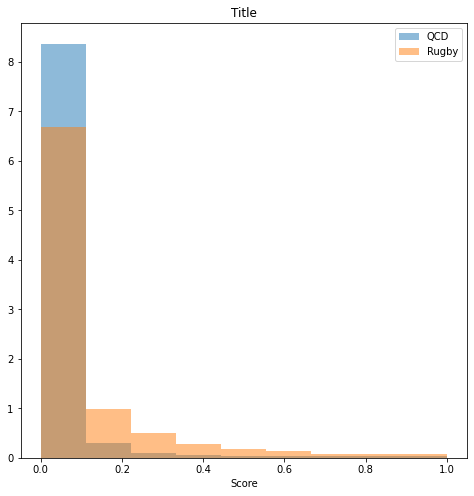

In [6]:
fig, ax = plt.subplots(1,1, figsize = (8,8))
ax.hist(tweets_df['Bot scores'], bins = np.linspace(0, max_bin, nbins), label = 'QCD', alpha = 0.5, density = True)
ax.hist(rugby_tweets_df['Bot scores'], bins = np.linspace(0, max_bin, nbins), label = 'Rugby', alpha = 0.5, density = True)

ax.legend()
ax.set_xlabel('Score')
ax.set_title("Title")
ax.set_xlim()

(-0.05, 1.05)

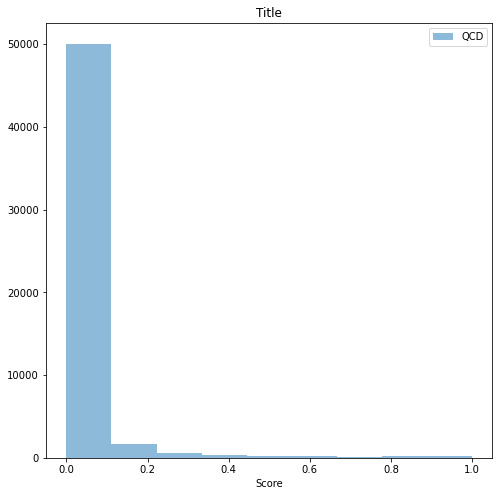

In [7]:
fig, ax = plt.subplots(1,1, figsize = (8,8))
ax.hist(tweets_latin_df['Bot scores'], bins = np.linspace(0, max_bin, nbins), label = 'QCD', alpha = 0.5)
ax.legend()
ax.set_xlabel('Score')
ax.set_title("Title")
ax.set_xlim()

(-0.05, 1.05)

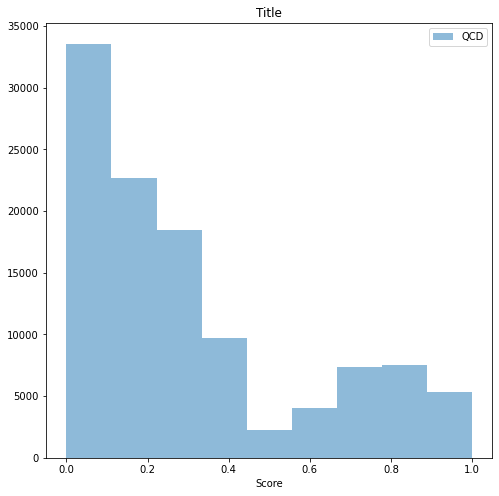

In [8]:
fig, ax = plt.subplots(1,1, figsize = (8,8))
ax.hist(tweets_df['Overall'], bins = np.linspace(0, max_bin, nbins), label = 'QCD', alpha = 0.5)
ax.legend()
ax.set_xlabel('Score')
ax.set_title("Title")
ax.set_xlim()

(-0.05, 1.05)

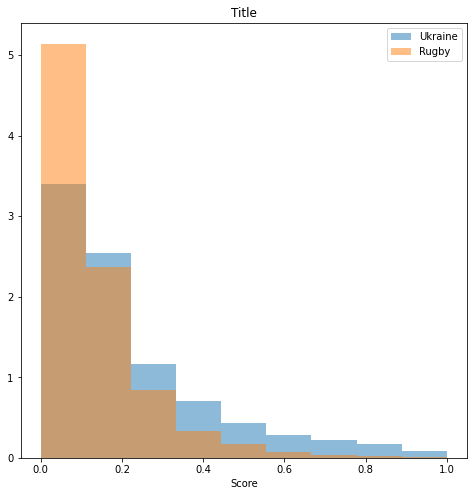

In [9]:
fig, ax = plt.subplots(1,1, figsize = (8,8))
ax.hist(tweets_df['Astroturf'], bins = np.linspace(0, max_bin, nbins), label = 'Ukraine', alpha = 0.5, density = True)
ax.hist(rugby_tweets_df['Astroturf'], bins = np.linspace(0, max_bin, nbins), label = 'Rugby', alpha = 0.5, density = True)
ax.legend()
ax.set_xlabel('Score')
ax.set_title("Title")
ax.set_xlim()

(-0.05, 1.05)

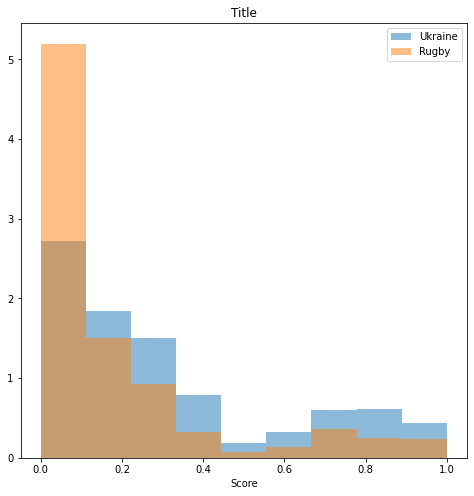

In [10]:
fig, ax = plt.subplots(1,1, figsize = (8,8))
ax.hist(tweets_df['Overall'], bins = np.linspace(0, max_bin, nbins), label = 'Ukraine', alpha = 0.5, density = True)
ax.hist(rugby_tweets_df['Overall'], bins = np.linspace(0, max_bin, nbins), label = 'Rugby', alpha = 0.5, density = True)
ax.legend()
ax.set_xlabel('Score')
ax.set_title("Title")
ax.set_xlim()

(-1.1, 1.1)

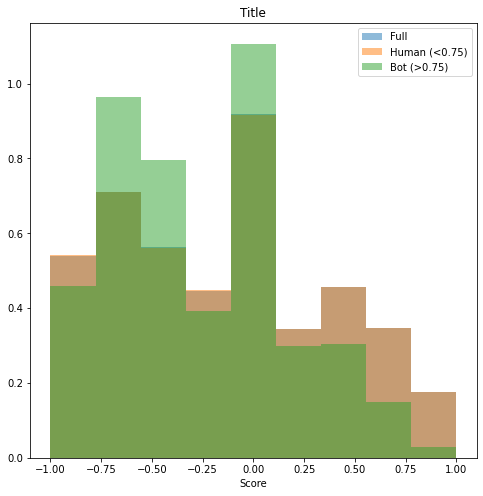

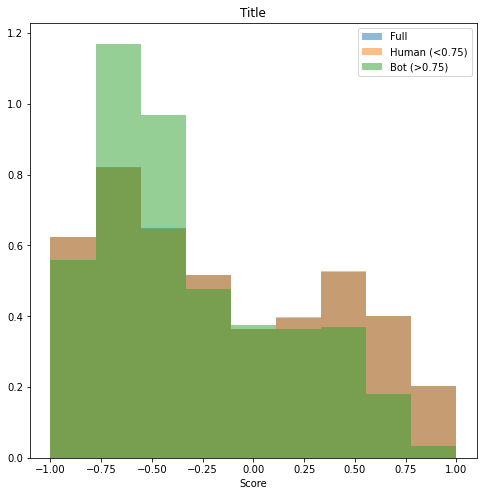

In [11]:
fig, ax = plt.subplots(1,1, figsize = (8,8))
sentiment_score_arr = tweets_df['Sentiment score']
bot_score_arr = tweets_df['Bot scores']

sentiment_score_arr2 = sentiment_score_arr.copy()
ids = np.where(sentiment_score_arr != 0)[0]
sentiment_score_arr2 = sentiment_score_arr[ids]
bot_score_arr2 = bot_score_arr[ids]

sentiment_score_arr2.reset_index(drop=True, inplace=True)
bot_score_arr2.reset_index(drop=True, inplace=True)


ax.hist(tweets_df['Sentiment score'], bins = np.linspace(-1, 1, nbins), label = 'Full', alpha = 0.5, density = True)
ax.hist(tweets_df['Sentiment score'].loc[np.where((tweets_df['Bot scores'] < 0.75))[0]], bins = np.linspace(-1, 1, nbins), label = 'Human (<0.75)', alpha = 0.5, density = True)
ax.hist(tweets_df['Sentiment score'].loc[np.where((tweets_df['Bot scores'] >= 0.75))[0]], bins = np.linspace(-1, 1, nbins), label = 'Bot (>0.75)', alpha = 0.5, density = True)
ax.legend()
ax.set_xlabel('Score')
ax.set_title("Title")
ax.set_xlim()

fig, ax = plt.subplots(1,1, figsize = (8,8))
ax.hist(sentiment_score_arr2, bins = np.linspace(-1, 1, nbins), label = 'Full', alpha = 0.5, density = True)
ax.hist(sentiment_score_arr2.loc[np.where((bot_score_arr2 < 0.75))[0]], bins = np.linspace(-1, 1, nbins), label = 'Human (<0.75)', alpha = 0.5, density = True)
ax.hist(sentiment_score_arr2[np.where((bot_score_arr2 >= 0.75))[0]], bins = np.linspace(-1, 1, nbins), label = 'Bot (>0.75)', alpha = 0.5, density = True)
ax.legend()
ax.set_xlabel('Score')
ax.set_title("Title")
ax.set_xlim()

(-1.1, 1.1)

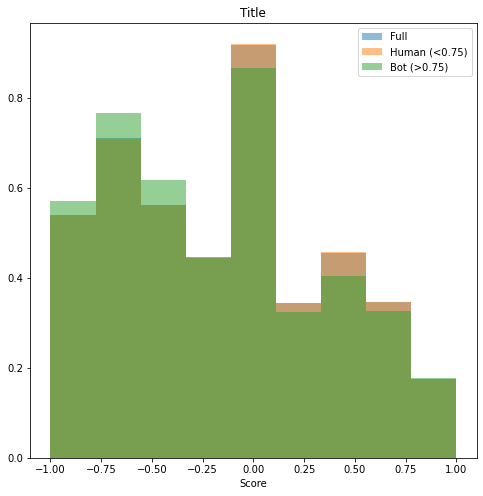

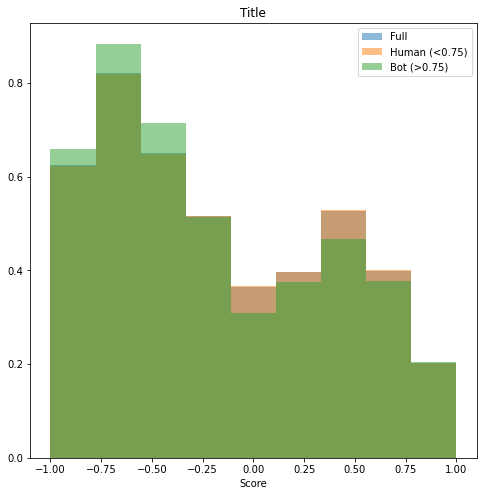

In [12]:
fig, ax = plt.subplots(1,1, figsize = (8,8))
sentiment_score_arr = tweets_df['Sentiment score']
bot_score_arr = tweets_df['Astroturf']

sentiment_score_arr2 = sentiment_score_arr.copy()
ids = np.where(sentiment_score_arr != 0)[0]
sentiment_score_arr2 = sentiment_score_arr[ids]
bot_score_arr2 = bot_score_arr[ids]

sentiment_score_arr2.reset_index(drop=True, inplace=True)
bot_score_arr2.reset_index(drop=True, inplace=True)


ax.hist(tweets_df['Sentiment score'], bins = np.linspace(-1, 1, nbins), label = 'Full', alpha = 0.5, density = True)
ax.hist(tweets_df['Sentiment score'].loc[np.where((tweets_df['Astroturf'] < 0.75))[0]], bins = np.linspace(-1, 1, nbins), label = 'Human (<0.75)', alpha = 0.5, density = True)
ax.hist(tweets_df['Sentiment score'].loc[np.where((tweets_df['Astroturf'] >= 0.75))[0]], bins = np.linspace(-1, 1, nbins), label = 'Bot (>0.75)', alpha = 0.5, density = True)
ax.legend()
ax.set_xlabel('Score')
ax.set_title("Title")
ax.set_xlim()

fig, ax = plt.subplots(1,1, figsize = (8,8))
ax.hist(sentiment_score_arr2, bins = np.linspace(-1, 1, nbins), label = 'Full', alpha = 0.5, density = True)
ax.hist(sentiment_score_arr2.loc[np.where((bot_score_arr2 < 0.75))[0]], bins = np.linspace(-1, 1, nbins), label = 'Human (<0.75)', alpha = 0.5, density = True)
ax.hist(sentiment_score_arr2[np.where((bot_score_arr2 >= 0.75))[0]], bins = np.linspace(-1, 1, nbins), label = 'Bot (>0.75)', alpha = 0.5, density = True)
ax.legend()
ax.set_xlabel('Score')
ax.set_title("Title")
ax.set_xlim()

In [13]:
bot_score_arr2.loc[np.where((bot_score_arr2 >= 0.75))[0]]

1        0.87
20       0.99
47       0.84
50       0.80
109      0.76
126      0.75
142      0.86
168      0.83
181      0.82
182      0.76
216      0.90
265      0.83
376      0.75
383      0.84
389      0.84
397      0.85
434      0.81
474      0.75
516      0.86
536      0.75
540      0.75
541      0.90
597      0.87
681      0.93
683      0.90
726      0.89
831      0.81
863      0.79
878      0.82
934      0.77
958      0.79
1003     0.84
1029     0.82
1039     0.81
1043     0.77
1260     0.78
1314     0.78
1349     0.85
1350     0.78
1363     0.81
1370     0.75
1424     0.94
1438     0.96
1452     0.84
1555     0.77
1582     0.88
1587     0.83
1618     0.84
1631     0.81
1641     0.81
1703     0.84
1714     0.80
1740     0.76
1846     0.77
1884     0.79
1889     0.78
1921     0.82
1935     0.77
1942     0.76
1945     0.87
1949     0.82
1958     0.86
2000     0.94
2057     0.88
2076     0.86
2090     0.91
2095     0.85
2117     0.75
2136     0.78
2173     0.86
2201     0.75
2376  

In [14]:
sentiment_score_arr2.loc[np.where((bot_score_arr2 >= 0.75))[0]]

1       -0.9134
20      -0.7096
47      -0.6369
50      -0.0258
109      0.7184
126     -0.6249
142     -0.4215
168      0.4019
181     -0.7910
182      0.2023
216     -0.5423
265      0.6808
376     -0.5423
383     -0.7430
389      0.2023
397     -0.2846
434     -0.7786
474     -0.5859
516     -0.2263
536     -0.4767
540      0.6369
541     -0.7964
597     -0.6705
681      0.4404
683     -0.3182
726     -0.3612
831     -0.4404
863      0.8519
878     -0.5688
934      0.9371
958      0.5859
1003    -0.8834
1029     0.1027
1039     0.6378
1043     0.0258
1260    -0.2732
1314     0.7430
1349    -0.3400
1350    -0.5286
1363    -0.5994
1370    -0.8658
1424    -0.1280
1438    -0.3400
1452     0.5859
1555    -0.8934
1582     0.4588
1587    -0.0772
1618     0.9447
1631    -0.2960
1641     0.5267
1703    -0.6908
1714     0.2263
1740    -0.4874
1846     0.3919
1884     0.3612
1889    -0.1531
1921    -0.9493
1935     0.2263
1942    -0.2960
1945    -0.7783
1949    -0.0516
1958    -0.5423
2000    

In [15]:
sentiment_score_arr2[np.where((bot_score_arr2 < 0.75))[0]]

0       -0.8126
2        0.3612
3        0.3612
4       -0.5423
5       -0.5574
6       -0.4404
7        0.3612
8        0.5806
9       -0.4215
10      -0.3182
11      -0.3400
12      -0.0258
13      -0.2500
14      -0.1280
16      -0.6705
17      -0.6808
18      -0.2960
19      -0.2500
21      -0.6369
22      -0.7717
23      -0.5330
24      -0.2819
25       0.8442
26      -0.8885
27      -0.0160
28      -0.3182
29       0.3612
30       0.5994
31      -0.2500
32      -0.5994
33      -0.5267
34      -0.5647
35      -0.1557
36      -0.5423
37      -0.7184
38       0.8625
39       0.4019
40      -0.5994
41      -0.5994
42       0.5859
43      -0.3400
44      -0.6249
45      -0.1779
46      -0.2960
48      -0.8625
49      -0.6124
51      -0.2960
52      -0.8020
53       0.5753
54       0.4019
55      -0.8176
56       0.3612
57      -0.1280
58       0.3919
59      -0.4939
60      -0.7269
61      -0.7506
62      -0.3182
63       0.4617
64      -0.3182
65      -0.6597
66      -0.7506
67      

(-1.1, 1.1)

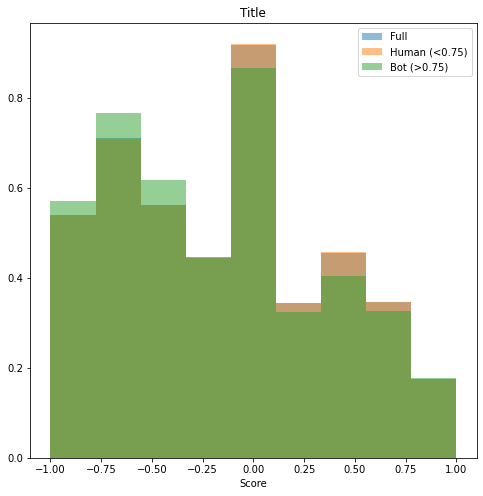

In [16]:
fig, ax = plt.subplots(1,1, figsize = (8,8))
ax.hist(tweets_df['Sentiment score'], bins = np.linspace(-1, 1, nbins), label = 'Full', alpha = 0.5, density = True)
ax.hist(tweets_df['Sentiment score'].loc[np.where((tweets_df['Astroturf'] < 0.75))[0]], bins = np.linspace(-1, 1, nbins), label = 'Human (<0.75)', alpha = 0.5, density = True)
ax.hist(tweets_df['Sentiment score'].loc[np.where((tweets_df['Astroturf'] >= 0.75))[0]], bins = np.linspace(-1, 1, nbins), label = 'Bot (>0.75)', alpha = 0.5, density = True)
ax.legend()
ax.set_xlabel('Score')
ax.set_title("Title")
ax.set_xlim()

(-1.1, 1.1)

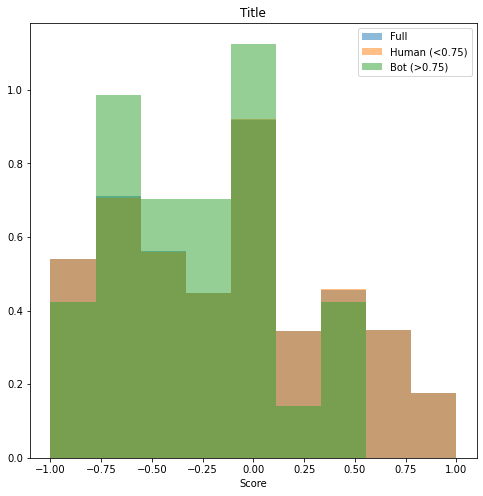

In [17]:
nbins = 10

fig, ax = plt.subplots(1,1, figsize = (8,8))
ax.hist(tweets_df['Sentiment score'], bins = np.linspace(-1, 1, nbins), label = 'Full', alpha = 0.5, density = True)
ax.hist(tweets_df['Sentiment score'].loc[np.where((tweets_df['Astroturf'] < 0.75) & (tweets_df['Bot scores'] < 0.75))[0]], bins = np.linspace(-1, 1, nbins), label = 'Human (<0.75)', alpha = 0.5, density = True)
ax.hist(tweets_df['Sentiment score'].loc[np.where((tweets_df['Astroturf'] >= 0.75)  & (tweets_df['Bot scores'] >= 0.75))[0]], bins = np.linspace(-1, 1, nbins), label = 'Bot (>0.75)', alpha = 0.5, density = True)
ax.legend()
ax.set_xlabel('Score')
ax.set_title("Title")
ax.set_xlim()

# Sentiment evolution

In [39]:
tweets_scores = tweets_df['Sentiment score']
tweets_dates = tweets_df['Datetime']

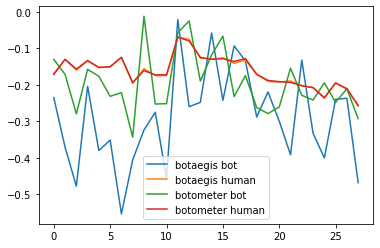

In [204]:
start_date = '2022-02-10'
end_date = '2022-03-10'

tweets_df = tweets_df.dropna(subset=['Display Name'], how='all')
tweets_df.reset_index(drop=True, inplace=True)

# We need a list of the dates we wish to look at
def create_date_list(start_date, end_date):
    start_datetime = datetime.datetime.strptime(start_date, "%Y-%m-%d")

    diff = datetime.datetime.strptime(end_date, "%Y-%m-%d") - datetime.datetime.strptime(start_date, "%Y-%m-%d")
    diff = diff.days

    date_list = []
    for day in range(diff):
        day_added = start_datetime + datetime.timedelta(days=day)
        day_added = datetime.datetime.strftime(day_added, "%Y-%m-%d")
        date_list.append(day_added)
    return date_list

def get_sentiment_evolution(tweets_df, start_date, end_date, exclude_neutral = False):
    date_list = create_date_list(start_date, end_date)
    
    # Get the indices corresponding to each date within the dataframe
    date_idxs_list = []
    for date in date_list:
        #print(date)
        date_idxs = np.where(tweets_df['Datetime'].str.split(' ').str[0] == date)[0]
        date_idxs_list.append(date_idxs)
    
    # Now find the sentiment on each day
    sentiment_on_day_mean_list = []
    for i, date in enumerate(date_list):
        #print(date_idxs_list[i])
        sentiment_on_day = tweets_df['Sentiment score'].loc[date_idxs_list[i]]
        
        if exclude_neutral is True:
            sentiment_on_day_neutral = sentiment_on_day.copy()
            #print(i, date)

            day_initial_idx = sentiment_on_day.index[0]
            
            sentiment_on_day_neutral = sentiment_on_day[day_initial_idx + np.where(sentiment_on_day != 0)[0]]
            sentiment_on_day = sentiment_on_day_neutral
            
        
        sentiment_on_day_mean = np.mean(sentiment_on_day)
        sentiment_on_day_mean_list.append(sentiment_on_day_mean)
        
        #sentiment_on_day_no_neutral = sentiment_on_day.drop()
        
    return sentiment_on_day_mean_list

sentiment_on_day_mean_list = get_sentiment_evolution(tweets_df, start_date, end_date)
sentiment_on_day_mean_no_neutral_list = get_sentiment_evolution(tweets_df, start_date, end_date, exclude_neutral = True)

botaegis_bot_tweets_df = tweets_df.loc[np.where((tweets_df['Bot scores'] > 0.75))[0]]
botaegis_human_tweets_df = tweets_df.loc[np.where((tweets_df['Bot scores'] <= 0.75))[0]]

botometer_bot_tweets_df = tweets_df.loc[np.where((tweets_df['Astroturf'] > 0.75))[0]]
botometer_human_tweets_df = tweets_df.loc[np.where((tweets_df['Astroturf'] <= 0.75))[0]]

botaegis_bot_tweets_df.reset_index(drop=True, inplace=True)
botaegis_human_tweets_df.reset_index(drop=True, inplace=True)

botometer_bot_tweets_df.reset_index(drop=True, inplace=True)
botometer_human_tweets_df.reset_index(drop=True, inplace=True)

exclude_neutral = True
botaegis_bot_sentiment_on_day_mean_list = get_sentiment_evolution(botaegis_bot_tweets_df, start_date, end_date, exclude_neutral = exclude_neutral)
botaegis_human_sentiment_on_day_mean_list = get_sentiment_evolution(botaegis_human_tweets_df, start_date, end_date, exclude_neutral = exclude_neutral)
botometer_bot_sentiment_on_day_mean_list = get_sentiment_evolution(botometer_bot_tweets_df, start_date, end_date, exclude_neutral = exclude_neutral)
botometer_human_sentiment_on_day_mean_list = get_sentiment_evolution(botometer_human_tweets_df, start_date, end_date, exclude_neutral = exclude_neutral)

exclude_neutral = False
botaegis_bot_sentiment_on_day_mean_no_neutral_list = get_sentiment_evolution(botaegis_bot_tweets_df, start_date, end_date, exclude_neutral = exclude_neutral)
botaegis_human_sentiment_on_day_mean_no_neutral_list = get_sentiment_evolution(botaegis_human_tweets_df, start_date, end_date, exclude_neutral = exclude_neutral)
botometer_bot_sentiment_on_day_mean_no_neutral_list = get_sentiment_evolution(botometer_bot_tweets_df, start_date, end_date, exclude_neutral = exclude_neutral)
botometer_human_sentiment_on_day_mean_no_neutral_list = get_sentiment_evolution(botometer_human_tweets_df, start_date, end_date, exclude_neutral = exclude_neutral)


#plt.plot(sentiment_on_day_mean_list)
#plt.plot(sentiment_on_day_mean_no_neutral_list)
plt.plot(botaegis_bot_sentiment_on_day_mean_list, label = 'botaegis bot')
plt.plot(botaegis_human_sentiment_on_day_mean_list, label = 'botaegis human')
plt.plot(botometer_bot_sentiment_on_day_mean_list, label = 'botometer bot')
plt.plot(botometer_human_sentiment_on_day_mean_list, label = 'botometer human')

plt.legend()



#plt.ylim(-0.5,0.5)

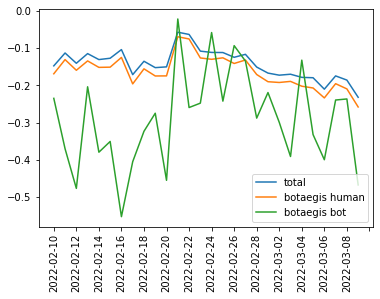

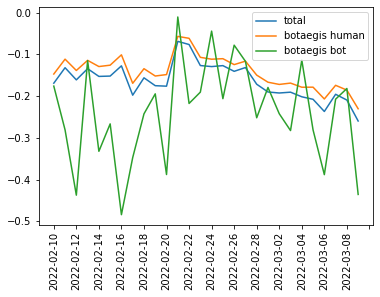

In [211]:
date_list = create_date_list(start_date, end_date)

plt.gca().xaxis.set_major_locator(plt.MaxNLocator(16))
plt.xticks(rotation=90)

plt.plot(sentiment_on_day_mean_list, label = 'total')
plt.plot(date_list, botaegis_human_sentiment_on_day_mean_list, label = 'botaegis human')
plt.plot(date_list, botaegis_bot_sentiment_on_day_mean_list, label = 'botaegis bot')
plt.legend()


plt.figure()
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(16))
plt.xticks(rotation=90)

plt.plot(sentiment_on_day_mean_no_neutral_list, label = 'total')
plt.plot(date_list, botaegis_human_sentiment_on_day_mean_no_neutral_list, label = 'botaegis human')
plt.plot(date_list, botaegis_bot_sentiment_on_day_mean_no_neutral_list, label = 'botaegis bot')
plt.legend()

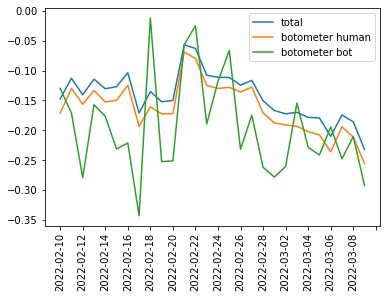

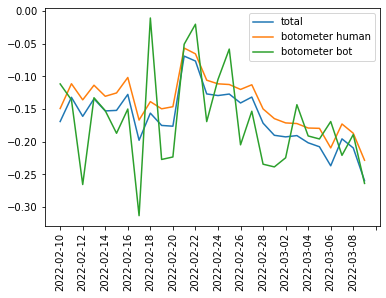

In [210]:
date_list = create_date_list(start_date, end_date)

plt.gca().xaxis.set_major_locator(plt.MaxNLocator(16))
plt.xticks(rotation=90)

plt.plot(sentiment_on_day_mean_list, label = 'total')
plt.plot(date_list, botometer_human_sentiment_on_day_mean_list, label = 'botometer human')
plt.plot(date_list, botometer_bot_sentiment_on_day_mean_list, label = 'botometer bot')
plt.legend()


plt.figure()
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(16))
plt.xticks(rotation=90)

plt.plot(sentiment_on_day_mean_no_neutral_list, label = 'total')
plt.plot(date_list, botometer_human_sentiment_on_day_mean_no_neutral_list, label = 'botometer human')
plt.plot(date_list, botometer_bot_sentiment_on_day_mean_no_neutral_list, label = 'botometer bot')
plt.legend()

In [189]:
botaegis_bot_tweets_df.shape[0]/30

27.1

In [203]:
botaegis_bot_tweets_df[['Datetime', 'Text', 'Sentiment score']]

,Datetime,Text,Sentiment score
0,2022-02-10 23:36:14+00:00,@marcorubio Thank you Rubio and Trump for emboldening Russia against Ukraine. \n\nYou did a fine job!,0.5106
1,2022-02-10 23:33:09+00:00,I voted for #BernieSanders. Now I see @BernieSanders asking us to allow #Russia to #annex #Ukraine. Now I wonder about Bernie.\n\nhttps://t.co/FUDK3O4MOB,0.2263
2,2022-02-10 23:28:38+00:00,"@BernieSanders, should we have attempted to look at the world from #Hitler's point of view before we fought Hitler?\n\n#Ukraine #Russia #BernieSanders #Appeasement",-0.3182
3,2022-02-10 23:09:22+00:00,"Russia invades Ukraine, NATO declares war, the Arabs and Iran invade Yemen, Turkey invades Syria and Iraq and the world ends there. https://t.co/p6nb2zQ5LH",-0.5994
4,2022-02-10 22:45:08+00:00,Sanders: US should 'put ourselves ... in Russia's position' because it 'might have legitimate concerns' #Russia #Ukraine #BernieSanders #truth #TheRussians https://t.co/OjIctVrP32 #FoxNews,0.3182
5,2022-02-10 22:39:13+00:00,#Russia: 3:08 ForMin #Lavrov has frosty session w UK #Truss abt #Ukraine https://t.co/MqADSiexBd,0.0000
6,2022-02-10 22:30:34+00:00,Sanders: US should 'put ourselves ... in Russia's position' because it 'might have legitimate concerns' https://t.co/EnL4Wq8yVs #FoxNews\nThis time and only time Bernie is right. Fk Ukraine,0.0000
7,2022-02-10 22:14:27+00:00,"'Russia has no plans to invade Ukraine or any other country,' says Moscow's ambassador to the EU. https://t.co/RAbNZcDua4",0.0000
8,2022-02-10 22:12:40+00:00,"Lt. General Flynn on the U.S., Russia, Ukraine, China, Iran, North Korea, Israel, Venezuela and The Military Age Males Being Dropped Down in America https://t.co/HiW4aAzPNn",0.0000
9,2022-02-10 22:04:57+00:00,Jerusalem maintains delicate balancing act over Russia-Ukraine tensions https://t.co/X6O9S8fK6d,-0.2732


In [170]:
get_sentiment_evolution(botaegis_human_tweets_df, start_date, end_date, exclude_neutral = exclude_neutral)

[-0.16880383933845244,
 -0.13066217541834962,
 -0.1593419894120923,
 -0.13419004341533977,
 -0.15156196555819476,
 -0.1509928526841443,
 -0.12478516339869264,
 -0.19600599999999996,
 -0.1555206574100314,
 -0.17471295718741145,
 -0.1744651928783382,
 -0.06916233877901966,
 -0.07514472547809986,
 -0.1262404031287607,
 -0.1298586516853932,
 -0.12583496304718583,
 -0.14109023394994544,
 -0.13174534979423855,
 -0.17076268053148494,
 -0.19013969204448256,
 -0.1921880898237636,
 -0.18926470753655855,
 -0.20223811247216011,
 -0.20700325443786954,
 -0.23376499112950813,
 -0.19544431405420415,
 -0.2094756063169767,
 -0.25808146370725926]

In [159]:
botaegis_bot_tweets_df.shape

(813, 23)

In [160]:
botaegis_huamn_tweets_df.shape

(111457, 23)

In [171]:
botaegis_bot_sentiment_on_day_mean_list

[-0.2349,
 -0.37050000000000016,
 -0.4770772727272728,
 -0.2038076923076923,
 -0.3797809523809524,
 -0.35087894736842107,
 -0.5531761904761906,
 -0.4052933333333334,
 -0.3234944444444445,
 -0.2749235294117648,
 -0.45538695652173916,
 -0.02141428571428571,
 -0.25959999999999994,
 -0.24781499999999998,
 -0.057905000000000005,
 -0.24239499999999997,
 -0.09310000000000003,
 -0.13453030303030303,
 -0.28805714285714284,
 -0.21928888888888887,
 -0.2993588235294118,
 -0.391323076923077,
 -0.13215200000000007,
 -0.332359090909091,
 -0.3999954545454545,
 -0.23938461538461542,
 -0.236525,
 -0.46782962962962965]

In [156]:
botaegis_human_sentiment_on_day_mean_list

[-0.176175,
 -0.2810689655172415,
 -0.4373208333333334,
 -0.11519565217391303,
 -0.33230833333333337,
 -0.266668,
 -0.48402916666666673,
 -0.34739428571428577,
 -0.24262083333333337,
 -0.19473750000000004,
 -0.3879222222222222,
 -0.010707142857142854,
 -0.21772903225806448,
 -0.19062692307692305,
 -0.0445423076923077,
 -0.20629361702127655,
 -0.07820400000000002,
 -0.11682894736842105,
 -0.25205,
 -0.1794181818181818,
 -0.24233809523809524,
 -0.2826222222222223,
 -0.11392413793103454,
 -0.28122692307692315,
 -0.3882308823529411,
 -0.20746666666666672,
 -0.1819423076923077,
 -0.4355655172413794]

In [38]:
import datetime

# We need a list of the dates we wish to look at
start_date = '2022-02-10'
end_date = '2022-03-10'
start_datetime = datetime.datetime.strptime(start_date, "%Y-%m-%d")

diff = dataetime.datetime.strptime(end_date, "%Y-%m-%d") - datetime.datetime.strptime(start_date, "%Y-%m-%d")
diff = diff.days

date_list = []
for day in range(diff):
    day_added = start_datetime + datetime.timedelta(days=day)
    day_added = datetime.datetime.strftime(day_added, "%Y-%m-%d")
    date_list.append(day_added)

In [76]:
date_idxs_list = []
for date in date_list:
    print(date)
    date_idxs = np.where(tweets_df['Datetime'].str.split(' ').str[0] == date)[0]
    date_idxs_list.append(date_idxs)
                                                        
    

2022-02-10
2022-02-11
2022-02-12
2022-02-13
2022-02-14
2022-02-15
2022-02-16
2022-02-17
2022-02-18
2022-02-19
2022-02-20
2022-02-21
2022-02-22
2022-02-23
2022-02-24
2022-02-25
2022-02-26
2022-02-27
2022-02-28
2022-03-01
2022-03-02
2022-03-03
2022-03-04
2022-03-05
2022-03-06
2022-03-07
2022-03-08
2022-03-09


In [77]:
date_idxs_list
ids = np.where(sentiment_score_arr != 0)[0]

[array([   0,    1,    2, ..., 3906, 3907, 3908]),
 array([3909, 3910, 3911, ..., 7990, 7991, 7992]),
 array([ 7993,  7994,  7995, ..., 12135, 12136, 12137]),
 array([12138, 12139, 12140, ..., 16206, 16207, 16208]),
 array([16209, 16210, 16211, ..., 20176, 20177, 20178]),
 array([20179, 20180, 20181, ..., 24039, 24040, 24041]),
 array([24042, 24043, 24044, ..., 27832, 27833, 27834]),
 array([27835, 27836, 27837, ..., 31683, 31684, 31685]),
 array([31686, 31687, 31688, ..., 35788, 35789, 35790]),
 array([35791, 35792, 35793, ..., 39865, 39866, 39867]),
 array([39868, 39869, 39870, ..., 43849, 43850, 43851]),
 array([43852, 43853, 43854, ..., 48088, 48089, 48090]),
 array([48091, 48092, 48093, ..., 52065, 52066, 52067]),
 array([52068, 52069, 52070, ..., 56001, 56002, 56003]),
 array([56004, 56005, 56006, ..., 60163, 60164, 60165]),
 array([60166, 60167, 60168, ..., 64216, 64217, 64218]),
 array([64219, 64220, 64221, ..., 68399, 68400, 68401]),
 array([68402, 68403, 68404, ..., 72560, 72

In [80]:
sentiment_on_day = tweets_df['Sentiment score'].loc[date_idxs_list[0]]
sentiment_on_day_mean = np.mean(sentiment_on_day)

In [81]:
sentiment_on_day_mean

-0.1474808646712715

In [82]:
sentiment_on_day_mean_list = []
for i, date in enumerate(date_list):
    sentiment_on_day = tweets_df['Sentiment score'].loc[date_idxs_list[i]]
    sentiment_on_day_mean = np.mean(sentiment_on_day)
    sentiment_on_day_mean_list.append(sentiment_on_day_mean)
    
    sentiment_on_day_no_neutral = sentiment_on_day.drop()

In [85]:
sentiment_on_day

108511   -0.8555
108512   -0.3442
108513    0.0516
108514    0.0000
108515    0.7351
108516    0.7184
108517   -0.2023
108518    0.0000
108519    0.3565
108520   -0.2960
108521   -0.8176
108522   -0.7650
108523   -0.8176
108524   -0.4767
108525   -0.8519
108526    0.0772
108527   -0.8555
108528    0.7046
108529    0.5574
108530    0.4939
108531   -0.9062
108532   -0.7906
108533   -0.4767
108534    0.2013
108535    0.2263
108536   -0.4939
108537   -0.7783
108538   -0.2537
108539    0.0000
108540   -0.5574
108541    0.4588
108542    0.0000
108543   -0.5423
108544    0.0516
108545   -0.8625
108546    0.2732
108547    0.4939
108548   -0.0191
108549   -0.8370
108550   -0.3182
108551    0.0000
108552    0.9073
108553    0.6486
108554    0.0000
108555   -0.3382
108556   -0.3818
108557   -0.6249
108558   -0.4299
108559   -0.8591
108560    0.4939
108561    0.0516
108562   -0.8834
108563    0.4939
108564    0.0000
108565   -0.6808
108566   -0.3400
108567    0.3612
108568    0.0000
108569    0.48

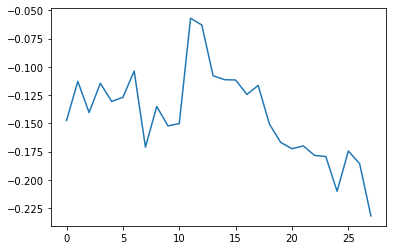

In [84]:
plt.plot(sentiment_on_day_mean_list)

# Let's dig into the tweets

In [18]:
tweets_df.loc[np.where((tweets_df['Bot scores'] > 0.75))[0]]

,Datetime,Tweet Id,Text,Username,Like Count,Display Name,Language,User Created,Astroturf,Fake follower,Financial,Other,Overall,Self declared,Spammer,Cap,Bot scores,Text_lemmatized,Sentiment score,Tokens,Overall topic number,Human topic number,Bot topic number
211,2022-02-10 23:36:14+00:00,1.49E+18,@marcorubio Thank you Rubio and Trump for emboldening Russia against Ukraine. \n\nYou did a fine job!,rightsandmight,0.0,Rights and might,en,07/05/2020,0.32,0.11,0.02,0.23,0.13,0.01,0.04,0.553973,0.817219,marcorubio thank rubio trump emboldening russia ukraine you fine job,0.5106,marcorubio thank rubio trump emboldening fine job,13,-99,6
238,2022-02-10 23:33:09+00:00,1.49E+18,I voted for #BernieSanders. Now I see @BernieSanders asking us to allow #Russia to #annex #Ukraine. Now I wonder about Bernie.\n\nhttps://t.co/FUDK3O4MOB,AnarchoTerran,0.0,Steafan Dubhuidhe,en,01/12/2021,0.17,0.27,0.00,0.22,0.46,0.00,0.08,0.796828,0.914376,i voted berniesanders now i see berniesanders asking u allow russia annex ukraine now i wonder bernie httpstcofudk3o4mob,0.2263,voted berniesanders see berniesanders asking u allow annex wonder bernie httpstcofudk3o4mob,2,-99,4
278,2022-02-10 23:28:38+00:00,1.49E+18,"@BernieSanders, should we have attempted to look at the world from #Hitler's point of view before we fought Hitler?\n\n#Ukraine #Russia #BernieSanders #Appeasement",AnarchoTerran,0.0,Steafan Dubhuidhe,en,01/12/2021,0.17,0.27,0.00,0.22,0.46,0.00,0.08,0.796828,0.843736,berniesanders attempted look world hitler point view fought hitler ukraine russia berniesanders appeasement,-0.3182,berniesanders attempted look world hitler point view fought hitler berniesanders appeasement,6,-99,7
421,2022-02-10 23:09:22+00:00,1.49E+18,"Russia invades Ukraine, NATO declares war, the Arabs and Iran invade Yemen, Turkey invades Syria and Iraq and the world ends there. https://t.co/p6nb2zQ5LH",Milanista203,0.0,Hamko,en,11/03/2012,0.14,0.00,0.01,0.20,0.04,0.00,0.00,0.306188,0.935490,russia invades ukraine nato declares war arab iran invade yemen turkey invades syria iraq world end httpstcop6nb2zq5lh,-0.5994,invades nato declares war arab iran invade yemen turkey invades syria iraq world end httpstcop6nb2zq5lh,8,-99,5
640,2022-02-10 22:45:08+00:00,1.49E+18,Sanders: US should 'put ourselves ... in Russia's position' because it 'might have legitimate concerns' #Russia #Ukraine #BernieSanders #truth #TheRussians https://t.co/OjIctVrP32 #FoxNews,tablerock32,0.0,TableRock,en,29/11/2021,0.23,0.34,0.40,0.59,0.39,0.03,0.01,0.793958,0.921077,sander u put russia position might legitimate concern russia ukraine berniesanders truth therussians httpstcoojictvrp32 foxnews,0.3182,sander u put position might legitimate concern berniesanders truth therussians httpstcoojictvrp32 foxnews,1,-99,4
698,2022-02-10 22:39:13+00:00,1.49E+18,#Russia: 3:08 ForMin #Lavrov has frosty session w UK #Truss abt #Ukraine https://t.co/MqADSiexBd,HyperObserver,0.0,Hyper Observer,en,18/05/2010,0.26,0.14,0.05,0.50,0.32,0.02,0.02,0.782636,0.802986,russia 308 formin lavrov frosty session w uk truss abt ukraine httpstcomqadsiexbd,0.0000,308 formin lavrov frosty session w uk truss abt httpstcomqadsiexbd,12,-99,18
768,2022-02-10 22:30:34+00:00,1.49E+18,Sanders: US should 'put ourselves ... in Russia's position' because it 'might have legitimate concerns' https://t.co/EnL4Wq8yVs #FoxNews\nThis time and only time Bernie is right. Fk Ukraine,malexanderFL,0.0,M.Alexander,en,24/03/2009,0.75,0.39,0.00,0.43,0.75,0.00,0.01,0.802148,0.759068,sander u put russia position might legitimate concern httpstcoenl4wq8yvs foxnews this time time bernie right fk ukraine,0.0000,sander u put position might legitimate concern httpstcoenl4wq8yvs foxnews time time bernie right fk,1,-99,4
913,2022-02-10 22:14:27+00:00,1.49E+18,"'Russia has no plans to invade Ukraine or any other country,' says Moscow's ambassador to the EU. https://t.co/RAbNZcDua4",Mflower555,2.0,Margarita,en,08/02/2012,0.23,0.16,0.02,0.11,0.02,0.02,0.01,0.252042,0.839826

In [19]:
tweets_latin_df.loc[np.where((tweets_latin_df['Bot scores'] > 0.75))[0]]

,Datetime,Tweet Id,Text,Username,Like Count,Display Name,Language,User Created,Astroturf,Fake follower,Financial,Other,Overall,Self declared,Spammer,Cap,Bot scores,Text_lemmatized,Sentiment score,Tokens,Overall topic number,Human topic number,Bot topic number
427,2022-02-10 22:14:27+00:00,1.490000e+18,"'Russia has no plans to invade Ukraine or any other country,' says Moscow's ambassador to the EU. https://t.co/RAbNZcDua4",Mflower555,2,Margarita,en,08/02/2012,0.23,0.16,0.02,0.11,0.02,0.02,0.01,0.252042,0.839826,russia plan invade ukraine country say moscow ambassador eu httpstcorabnzcdua4,0.0000,plan invade country say moscow ambassador eu httpstcorabnzcdua4,15,-99,0
535,2022-02-10 21:48:40+00:00,1.490000e+18,‘They used axes to spare the ammo’: How modern Ukraine's Nazi heroes massacred civilians during WWII — RT Russia &amp; Former Soviet Union https://t.co/jVLlVEPmeV,flyer4life,0,sam,en,19/06/2011,0.71,0.21,0.01,0.41,0.71,0.00,0.00,0.798312,0.962503,they used ax spare ammo how modern ukraine nazi hero massacred civilian wwii rt russia amp former soviet union httpstcojvllvepmev,0.5574,used ax spare ammo modern nazi hero massacred civilian wwii rt amp former soviet union httpstcojvllvepmev,2,-99,18
801,2022-02-10 20:46:50+00:00,1.490000e+18,"@Reuters They're just pissed off she didn't sell Ukraine down the river, and they didn't get what they'd hoped for.\n\nLet's not forget, Russia poisoned UK citizens on UK soil in Salisbury.",StAustellAdam,2,Adam Harris,en,07/08/2011,0.25,0.05,0.00,0.19,0.08,0.00,0.02,0.419722,0.901013,reuters theyre pissed didnt sell ukraine river didnt get theyd hoped let forget russia poisoned uk citizen uk soil salisbury,-0.8881,reuters theyre pissed didnt sell river didnt get theyd hoped let forget poisoned uk citizen uk soil salisbury,1,-99,19
938,2022-02-10 20:13:54+00:00,1.490000e+18,Russia tells Britain it's wasting money on Ukraine — RT Russia &amp; Former Soviet Union https://t.co/07rnKdrzW7,jondknight,0,Jonathan Knight,en,10/10/2010,0.36,0.57,0.03,0.48,0.57,0.04,0.11,0.796929,0.874989,russia tell britain wasting money ukraine rt russia amp former soviet union httpstco07rnkdrzw7,-0.4019,tell britain wasting money rt amp former soviet union httpstco07rnkdrzw7,15,-99,14
1211,2022-02-10 19:10:49+00:00,1.490000e+18,@FrostyelBanana @rumpcoterrl @Chrohrsh @pcgamer Go enlist then.. I heard Russia is invading Ukraine soon.,_Danger_Erin,0,Erin B. ❁,en,03/04/2017,0.06,0.17,0.06,0.12,0.06,0.00,0.01,0.362646,0.978136,frostyelbanana rumpcoterrl chrohrsh pcgamer go enlist i heard russia invading ukraine soon,0.0000,frostyelbanana rumpcoterrl chrohrsh pcgamer go enlist heard invading soon,14,-99,16
1322,2022-02-10 18:49:02+00:00,1.490000e+18,"Ukraine-Russia: We won't accept a powerful country 'bullying neighbours', insists Boris Johnson - https://t.co/1kg09EqvVQ #news https://t.co/PZju1oWW6C",condorbox,0,Andrea C.,en,24/12/2010,0.15,0.16,0.01,0.50,0.38,0.02,0.03,0.793087,0.807199,ukrainerussia we wont accept powerful country bullying neighbour insists boris johnson httpstco1kg09eqvvq news httpstcopzju1oww6c,-0.8134,ukrainerussia wont accept powerful country bullying neighbour insists boris johnson httpstco1kg09eqvvq news httpstcopzju1oww6c,1,-99,15
1377,2022-02-10 18:38:40+00:00,1.490000e+18,Russia tells Britain it's wasting money on Ukraine — RT Russia &amp; Former Soviet Union https://t.co/wDnoZRnNsj,Roland59201632,0,Roland,en,06/04/2014,0.31,0.18,0.02,0.50,0.28,0.00,0.03,0.766877,0.874989,russia tell britain wasting money ukraine rt russia amp former soviet union httpstcowdnozrnnsj,-0.4019,tell britain wasting money rt amp former soviet union httpstcowdnozrnnsj,15,-99,14
1469,2022-02-10 18:19:36+00:00,1.490000e+18,How about warning them about the world in general? Russia ain't the only bad actor on the block. #russia #hacking #ukraine https://t.co/K1vJDkDhL6,SCOR16,0,Sean O'Rourke,en,20/07/2010,0.05,0.24,0.04,0.47,0.22,0.11,0.00,0.717691,0.823507,how warning world general russia aint bad actor block russia h

In [20]:
rugby_tweets_df.loc[np.where((rugby_tweets_df['Bot scores'] > 0.75))[0]]

,Datetime,Tweet Id,Text,Username,Like Count,Display Name,Language,User Created,Astroturf,Fake follower,Financial,Other,Overall,Self declared,Spammer,Cap,Bot scores,Text_lemmatized,Sentiment score,Tokens,Overall topic number,Human topic number,Bot topic number
130,2022-02-10 22:31:52+00:00,1.490000e+18,Check out Gillette Great Britain Rugby League Tri-Nations 2006 Double DVD Box Set [R0] https://t.co/Jr5DUyoIXb @eBay,Housequake73,0,Andrew Neil,en,28/03/2009,0.04,0.55,0.05,0.93,0.93,0.77,0.48,0.891232,0.981178,check gillette great britain rugby league trinations 2006 double dvd box set r0 httpstcojr5duyoixb ebay,0.6249,check gillette great britain rugby league trinations 2006 double dvd box set r0 httpstcojr5duyoixb ebay,4,-99,18
344,2022-02-10 21:10:39+00:00,1.490000e+18,@DarrenHowells2 Rugby league neglect their goal kickers don't they. Never been as good as union ones I find.,OfficialRTC,0,Craig 🏴󠁧󠁢󠁷󠁬󠁳󠁿🏴‍☠️🦢🏉,en,30/04/2009,0.12,0.10,0.00,0.06,0.01,0.00,0.00,0.226318,0.756672,darrenhowells2 rugby league neglect goal kicker dont never good union one i find,-0.2405,darrenhowells2 rugby league neglect goal kicker dont never good union one find,17,-99,5
350,2022-02-10 21:07:28+00:00,1.490000e+18,World Rugby Classic mourns death of former player Tom Kiernan https://t.co/kLH1Ft3XN9 https://t.co/s3tnJy0hTX,TheRoyalGazette,0,The Royal Gazette,en,19/02/2009,0.19,0.58,0.00,0.94,0.94,0.46,0.06,0.899551,0.942945,world rugby classic mourns death former player tom kiernan httpstcoklh1ft3xn9 httpstcos3tnjy0htx,-0.8074,world rugby classic mourns death former player tom kiernan httpstcoklh1ft3xn9 httpstcos3tnjy0htx,15,-99,5
502,2022-02-10 20:12:49+00:00,1.490000e+18,@charles_watts how they unhappy when the keeper rugby tackled laca ahahahaha,afcrbenson,57,Ross,en,16/08/2015,0.05,0.07,0.00,0.27,0.08,0.07,0.02,0.419722,0.850369,charles_watts unhappy keeper rugby tackled laca ahahahaha,-0.4215,charles_watts unhappy keeper rugby tackled laca ahahahaha,15,-99,4
528,2022-02-10 20:05:01+00:00,1.490000e+18,"Fuck me. Hicks straight into Moore there, “get ya yellow out Liam” 🤦🏻‍♂️🤦🏻‍♂️🤦🏻‍♂️\n\nFucking rugby 🏉 Let them have some fucking needle for fuck sake\n\n#SLStHCat",Rhinoshaund_VI,0,Shaun Dennison,en,20/02/2009,0.04,0.01,0.00,0.06,0.00,0.00,0.01,0.000000,0.925869,fuck hick straight moore get ya yellow liam fucking rugby let fucking needle fuck sake slsthcat,-0.7490,fuck hick straight moore get ya yellow liam fucking rugby let fucking needle fuck sake slsthcat,17,-99,11
612,2022-02-10 19:36:55+00:00,1.490000e+18,entrance-to-hove-recreation-park-view-local-rugby-club-house-sign-warning-hedge-cutting https://t.co/RDWIQkN59t,DenisePeillon,0,Denise Peillon,en,15/11/2015,0.24,0.41,0.10,0.73,0.73,0.08,0.12,0.799836,0.800418,entrancetohoverecreationparkviewlocalrugbyclubhousesignwarninghedgecutting httpstcordwiqkn59t,0.0000,entrancetohoverecreationparkviewlocalrugbyclubhousesignwarninghedgecutting httpstcordwiqkn59t,9,-99,8
716,2022-02-10 18:55:29+00:00,1.490000e+18,@Rugby_Religion Nigga me too lmaoooo blame the government,fadedhasselh0ff,1,Tha Formula,en,01/04/2020,0.03,0.00,0.01,0.07,0.01,0.00,0.00,0.226318,0.880817,rugby_religion nigga lmaoooo blame government,-0.3400,rugby_religion nigga lmaoooo blame government,3,-99,0
867,2022-02-10 17:55:53+00:00,1.490000e+18,"@mikemarlowe6 @Scotlandteam @SixNationsRugby A thumb with glasses trying to be funny about foreigners yet hails from London.\nHoly fuck,the irony of it.",WilliamEddwards,1,William Edwards,en,11/10/2021,0.11,0.76,0.05,0.68,0.79,0.79,0.28,0.810078,0.820730,mikemarlowe6 scotlandteam sixnationsrugby a thumb glass trying funny foreigner yet hail london holy fuckthe irony,0.4588,mikemarlowe6 scotlandteam sixnationsrugby thumb glass trying funny foreigner yet hail london holy fuckthe irony,16,-99,11
933,2022-02-10 17:18:02+00:00,1.490000e+18,@Rugby_Religion Cop a brick of dog,fadedhasselh0ff,0,Tha Formula,en,01/04/2020,0.03,0.00,0.01,0.07,0.01,0.00,0.00,0.226318,0.766854,rugby_religion cop brick dog,0

In [99]:
print(len(np.where((tweets_df['Bot scores'] > 0.75))[0]))
print(len(np.where((rugby_tweets_df['Bot scores'] > 0.75))[0]))
print(len(np.where((tweets_latin_df['Bot scores'] > 0.75))[0]))
print(len(np.where((rugby_tweets_latin_df['Bot scores'] > 0.75))[0]))

813
1160
375
508


In [16]:
tweets_df.loc[np.where((tweets_df['Bot scores'] > 0.75) & (tweets_df['Astroturf'] > 0.75))[0]].head(100)

,Datetime,Tweet Id,Text,Username,Like Count,Display Name,Language,User Created,Astroturf,Fake follower,Financial,Other,Overall,Self declared,Spammer,Cap,Bot scores,Text_lemmatized,Sentiment score,Tokens,Overall topic number,Human topic number,Bot topic number
4715,2022-02-11 23:31:26+00:00,1.49E+18,Russia reportedly makes decision to invade Ukraine Yahoo Finance.\n\nhttps://t.co/xfJnurxUFY,Joseph_Santoro,0.0,Dr. Joseph Santoro 🇺🇲🇺🇦🇺🇳🇪🇺,en,17/01/2009,0.79,0.29,0.02,0.46,0.79,0.00,0.03,0.810078,0.767433,russia reportedly make decision invade ukraine yahoo finance httpstcoxfjnurxufy,0.0000,reportedly make decision invade yahoo finance httpstcoxfjnurxufy,15,-99,0
5357,2022-02-11 23:09:31+00:00,1.49E+18,Paul Manafort forced the RNC in 2016 to remove anti-Russia policy on Ukraine from its platform.,greencounterktd,0.0,🌻🇺🇦greencounter kate ✍🏻,en,31/07/2010,0.93,0.18,0.00,0.34,0.93,0.00,0.01,0.891232,0.782781,paul manafort forced rnc 2016 remove antirussia policy ukraine platform,-0.4588,paul manafort forced rnc 2016 remove antirussia policy platform,13,-99,15
15797,2022-02-13 20:22:29+00:00,1.49E+18,U.S. says Russia may create pretext to attack Ukraine - Reuters https://t.co/Kd1fecXAuG #news #feedly,drpatfarrell,0.0,"Patricia Farrell, Ph.D.",en,26/05/2009,0.77,0.24,0.01,0.35,0.77,0.01,0.03,0.805478,0.924930,u say russia may create pretext attack ukraine reuters httpstcokd1fecxaug news feedly,-0.2500,u say may create pretext attack reuters httpstcokd1fecxaug news feedly,18,-99,6
16502,2022-02-14 23:42:22+00:00,1.49E+18,"Going Underground RT (@Underground_RT\n@afshinrattansi):\n\nRussia Needs To Look in The Mirror Over Ukraine, NATO Expansion!-Advisor to President Obama.\n\nVideo ~20:28min\n\nhttps://t.co/gQgjzAB6b5",AtchaJohn,0.0,Kindly Atcha 🍀 ❌,en,13/07/2013,0.96,0.19,0.00,0.31,0.96,0.00,0.00,0.915838,0.998677,going underground rt underground_rt afshinrattansi russia need to look the mirror over ukraine nato expansionadvisor president obama video 2028min httpstcogqgjzab6b5,0.0000,going underground rt underground_rt afshinrattansi need look mirror nato expansionadvisor president obama video 2028min httpstcogqgjzab6b5,13,-99,13
20259,2022-02-15 23:55:33+00:00,1.49E+18,.\n⁉️⁉️ 🏁 ⁉️⁉️ 🏁 ⁉️⁉️\n\nRt Russia Claims Ukraine Standoff Is Over https://t.co/FzS3cmKTlp via @BreitbartNews,Charlot75877777,1.0,Charlotte Research 🚚 🇹🇼 🇺🇸 🇨🇦 🇮🇱 🇺🇦,en,10/07/2020,0.77,0.36,0.17,0.49,0.77,0.04,0.06,0.805478,0.949607,rt russia claim ukraine standoff is over httpstcofzs3cmktlp via breitbartnews,0.0000,rt claim standoff httpstcofzs3cmktlp via breitbartnews,15,-99,14
21506,2022-02-15 22:45:27+00:00,1.49E+18,"Why did Trump's GOP water down its support for Ukraine in 2016, Mueller asked in Russia probe - U.S. News - https://t.co/Bsgadj0MCq https://t.co/ctfOi9x96Z",judemgreen,0.0,Jude Green,en,04/08/2012,0.80,0.19,0.03,0.38,0.11,0.00,0.00,0.502712,0.902508,why trump gop water support ukraine 2016 mueller asked russia probe u news httpstcobsgadj0mcq httpstcoctfoi9x96z,0.4019,trump gop water support 2016 mueller asked probe u news httpstcobsgadj0mcq httpstcoctfoi9x96z,13,-99,12
24011,2022-02-15 21:04:32+00:00,1.49E+18,Amb. Bill Taylor On Russia-Ukraine Crisis: 'Don't Negotiate With A Gun T... https://t.co/vzmf1t4zYK via @YouTube,Gummbyman32,0.0,Randy Gummerman,en,19/03/2013,0.96,0.42,0.09,0.57,0.96,0.01,0.03,0.915838,0.844618,amb bill taylor on russiaukraine crisis dont negotiate with a gun t httpstcovzmf1t4zyk via youtube,-0.7579,amb bill taylor russiaukraine crisis dont negotiate gun httpstcovzmf1t4zyk via youtube,1,-99,15
28422,2022-02-17 23:23:05+00:00,1.49E+18,Western media destroyed their reputation with fake Ukraine news – Moscow — RT Russia &amp; Former Soviet Union https://t.co/pmVUHFUvqA,flyer4life,0.0,sam,en,19/06/2011,0.83,0.28,0.00,0.49,0.83,0.01,0.00,0.824092,0.976795,western medium destroyed reputation fake ukraine news moscow rt russia amp former soviet union httpstcopmvuhfuvqa,-0.7430,western medium destroyed reputation fake news moscow rt amp fo

# Twibot results

In [124]:
tweets_twibot_df = pd.read_csv('../data/checked_tweets/ukraine_russia/tweets_raw_en_df_individual_5000dailytweets_2022-02-10_to_2022-03-10_botometer_botaegis_twibot_test.csv')
rugby_tweets_twibot_df = pd.read_csv('../data/checked_tweets/rugby/tweets_raw_en_df_individual_5000dailytweets_2022-02-10_to_2022-03-10_botometer_botaegis_twibot_test.csv')
tweets_twibot_mixed_df = pd.read_csv('../data/checked_tweets/ukraine_russia/tweets_raw_en_df_individual_5000dailytweets_2022-02-10_to_2022-03-10_botometer_botaegis_twibot_test_mixed.csv')
rugby_tweets_twibot_mixed_df = pd.read_csv('../data/checked_tweets/rugby/tweets_raw_en_df_individual_5000dailytweets_2022-02-10_to_2022-03-10_botometer_botaegis_twibot_test_mixed.csv')

tweets_twibot_full_df = pd.read_csv('../data/checked_tweets/ukraine_russia/tweets_raw_en_df_individual_5000dailytweets_2022-02-10_to_2022-03-10_botometer_botaegis_twibot_full.csv')
rugby_tweets_twibot_full_df = pd.read_csv('../data/checked_tweets/rugby/tweets_raw_en_df_individual_5000dailytweets_2022-02-10_to_2022-03-10_botometer_botaegis_twibot_full.csv')
tweets_twibot_full_200verified2019_df = pd.read_csv('../data/checked_tweets/ukraine_russia/tweets_raw_en_df_individual_5000dailytweets_2022-02-10_to_2022-03-10_botometer_botaegis_twibot_full_200verified2019.csv')
rugby_tweets_twibot_full_200verified2019_df = pd.read_csv('../data/checked_tweets/rugby/tweets_raw_en_df_individual_5000dailytweets_2022-02-10_to_2022-03-10_botometer_botaegis_twibot_full_200verified2019.csv')

In [24]:
print(len(np.where((tweets_twibot_df['Bot scores'] > 0.95))[0]))
print(len(np.where((rugby_tweets_twibot_df['Bot scores'] > 0.95))[0]))
print(len(np.where((tweets_twibot_mixed_df['Bot scores'] > 0.75))[0]))
print(len(np.where((rugby_tweets_twibot_mixed_df['Bot scores'] > 0.75))[0]))

4497
708
16
210


In [28]:
tweets_twibot_df.loc[np.where((tweets_twibot_df['Bot scores'] > 0.75))[0]].head(100)

,Unnamed: 0,Unnamed: 0.1,Datetime,Tweet Id,Text,Username,Like Count,Display Name,Language,User Created,Astroturf,Fake follower,Financial,Other,Overall,Self declared,Spammer,Cap,Bot scores
3,3,3,2022-02-10 23:59:32+00:00,1.49192E+18,"@jamesfahey15 @NiecyOKeeffe Bit by bit they’ll [ Russia ] will nick parts of Ukraine like they did Crimea, Georgia",38jyennac,2.0,Gerbale,en,07/09/2011,0.56,0.04,0.00,0.28,0.03,0.00,0.00,0.278726,0.785896
14,14,14,2022-02-10 23:57:34+00:00,1.49192E+18,"@NiecyOKeeffe @jamesfahey15 Bluff ! It could be ,but what have Russia got to gain by moving the entire Russian war machine west other than to at the very minimum annex the Donetsk People's Republic and Luhansk People's Republic parts of Ukraine long squabbled over .",38jyennac,2.0,Gerbale,en,07/09/2011,0.56,0.04,0.00,0.28,0.03,0.00,0.00,0.278726,0.762311
25,25,25,2022-02-10 23:56:20+00:00,1.49192E+18,"@InvestTex @Ejiketion Really😂. If tht ws the case why is NATO sending France as its delegation?Russia hs always complained abt NATO's expansion especially at its doorsteps.Poland ws a mistake,they cnt afford Ukraine.Once Ukraine joins,it cn use article 5 to reclaim Crimea &amp; Russia wont stand a chance",waBuyaphi,3.0,sibangilizwe mhlani,en,15/04/2018,0.45,0.05,0.00,0.35,0.12,0.01,0.01,0.528866,0.944711
26,26,26,2022-02-10 23:56:15+00:00,1.49192E+18,#Russia likely to invade #Ukraine in days’ time as #Belarus military drills serve as ‘cover’: Sen. Cotton https://t.co/sWrI4HwrFs #FoxNews,SoizaDavid,0.0,David Soiza,en,10/05/2020,0.31,0.36,0.11,0.50,0.32,0.02,0.07,0.782636,0.844617
27,27,27,2022-02-10 23:56:08+00:00,1.49192E+18,Opinion | The ‘Ten Plagues’ facing Israel if Russia invades Ukraine https://t.co/OnP75aDR0l,josrz,0.0,joanne tracy,en,15/06/2009,0.28,0.06,0.01,0.27,0.10,0.01,0.00,0.475677,0.827724
36,36,36,2022-02-10 23:55:05+00:00,1.49192E+18,Just wondering what the #odds are for Russia invading Ukraine during the Super Bowl?,jg0709,0.0,Bored@Home,en,15/04/2009,0.05,0.25,0.02,0.45,0.40,0.04,0.25,0.794672,0.874540
37,37,37,2022-02-10 23:55:04+00:00,1.49192E+18,The UK's The National Cyber Security Centre has warned of potential #cyberattack against the country’s critical infrastructure should Russia invade Ukraine.\n\nhttps://t.co/RakwAUpci3,mdcstp,1.0,Marc St-Pierre,en,09/12/2009,0.06,0.35,0.03,0.57,0.61,0.61,0.14,0.796667,0.988772
41,41,41,2022-02-10 23:54:48+00:00,1.49192E+18,"@JudeElms @PB0151 @Soliy87 @anyotherleader @Iabourite @Keir_Starmer I'm not defending Russian aggression toward Ukraine. But the realpolitik is this was known to be a possible outcome, so let's not pretend NATO are being purely defensive here. They made geopolitical choices. Russia reacted predictably.",SeanOFlynn6,0.0,Sean O'Flynn 🟨🟥,en,18/02/2019,0.28,0.07,0.00,0.23,0.05,0.03,0.01,0.334231,0.855269
43,43,43,2022-02-10 23:54:31+00:00,1.49192E+18,"“Satellite images collected on Wednesday and Thursday reveal new deployment and positioning of #Russian military equipment and troops in multiple locations around #Ukraine, including #Crimea, western #Russia and #Belarus,…” https://t.co/8YjUwJMiTM",SoizaDavid,1.0,David Soiza,en,10/05/2020,0.31,0.36,0.11,0.50,0.32,0.02,0.07,0.782636,0.809565
56,56,56,2022-02-10 23:53:31+00:00,1.49192E+18,Bottom line: Russia will invade Ukraine. \n\nBiden on Ukraine situation: 'Things could go crazy quickly'\nhttps://t.co/vEjiOpW2H5,NotAbouThatBase,1.0,(((Sen. 𝔾🇺🇦𝕝𝕕𝕞𝕒𝕟))),en,28/05/2016,0.50,0.10,0.00,0.14,0.07,0.00,0.01,0.391216,0.834855


In [16]:
tweets_twibot_df.loc[np.where((tweets_twibot_df['Bot scores'] > 0.98) & (tweets_twibot_df['Astroturf'] > 0.7))[0]].head(100)

,Unnamed: 0,Unnamed: 0.1,Datetime,Tweet Id,Text,Username,Like Count,Display Name,Language,User Created,Astroturf,Fake follower,Financial,Other,Overall,Self declared,Spammer,Cap,Bot scores
957,957,957,2022-02-10 22:08:51+00:00,1.4919E+18,"@tom_watson Afghanistan, Iraq, Syria, Libya ruined. Apartheid in Israel. Supporting fascist Banderistas in Ukraine to the verge of war with Russia. NATO is its own worst enemy, an aggressive organisation which is a tool of US hegemonism.",hulme_edward,16.0,Edward Hulme 💙,en,14/11/2019,0.73,0.13,0.00,0.27,0.22,0.01,0.00,0.717691,0.990084
6111,6111,6111,2022-02-11 22:45:25+00:00,1.49227E+18,Vitalik Buterin takes a stand against Russian aggression \n✊️✊️✊️\n\n#Ukraine #Taiwan #China #Russia #Ethereum \nhttps://t.co/NgZyxXukMm,twigwam,3.0,twigwam.tez,en,16/12/2010,0.75,0.15,0.00,0.21,0.19,0.02,0.01,0.676362,0.999368
7593,7593,7593,2022-02-11 22:06:41+00:00,1.49226E+18,#Ukraine Will Resist the coming #Russia Military #Invasion by #Putin's #RussianArmy #DefendUkraine #DefendDemocracy against #VladimirPutin #WWIII https://t.co/ttw5sGAiA5,DannyVoglesong,5.0,Daniel Voglesong,en,26/08/2011,0.71,0.42,0.03,0.59,0.71,0.02,0.01,0.798312,0.992221
8355,8355,8355,2022-02-12 23:40:20+00:00,1.49264E+18,Laughable if not pathetic Russia will Obliterate the Fascist Neo Nazi Ukraine weaklings https://t.co/fc2Qzimkjx,carter_embrey,0.0,CARTER EMBREY,en,10/04/2017,0.79,0.41,0.03,0.49,0.79,0.01,0.01,0.810078,0.988340
11419,11419,11419,2022-02-12 21:12:11+00:00,1.49261E+18,Loser Biden threatens Putin with nude photos of Jill Biden if Russia takes Ukraine https://t.co/YW3VqC4W7Q via @nypost,Mr_Holtzworth,1.0,Trevor 1,en,22/06/2011,0.80,0.18,0.02,0.53,0.80,0.00,0.01,0.812935,0.984476
11872,11872,11872,2022-02-12 20:51:13+00:00,1.4926E+18,"Re #Ukraine\nI think all this #Putin drama/BS is just a publicity stunt!\n\nCuz, it's like, anytime more of #Trump's criminal behavior comes out &amp; it's all over the news, Putin will act up &amp; then the #news is all about #Russia \n🤬🖕 #Putin #Trump &amp; @GOP ☠️\n&amp; 💣 #Russia already!🤷‍♀️🤦‍♀️",IceCold_Blaze,2.0,✨Lisa🌷Votes💎Blue🍹🙋‍♀️🌊🆘🌊,en,24/07/2019,0.85,0.20,0.02,0.38,0.85,0.00,0.01,0.833918,0.981414
13835,13835,13835,2022-02-13 22:07:12+00:00,1.49298E+18,#WritingCommunity #writing #amwriting #Ukraine #Russia #Putin #Biden #UkraineInvasion #UkraineCrisis #UkraineWillResist #ukrainerussia #UkraineWar #Ukrainekrise \nHow the Ukraine Crisis Could Save Joe Biden – Simily https://t.co/knjnULlvdQ,DanTheLyons,2.0,vortex5🌚🌝🌗🌓🌖🌔,en,23/11/2018,0.83,0.38,0.00,0.28,0.83,0.00,0.00,0.824092,0.997706
15838,15838,15838,2022-02-13 20:20:32+00:00,1.49296E+18,"Plse help re-tweet far and wide, #Ukraine is repeatedly demonstrating a desire for #peace, #diplomacy, #dialogue…and is calling on Russia to #act in good faith. @brhodes @OlgaNYC1211 @RepSwalwell @RepAdamSchiff @SpeakerPelosi @ProjectLincoln @MeidasTouch @McFaul @AVindman 👇🏽 https://t.co/bUNOgH48di",RocBrady,1.0,Roc Brady United Against Gun Violence,en,01/08/2014,0.80,0.25,0.00,0.34,0.80,0.01,0.03,0.812935,0.998127
18572,18572,18572,2022-02-14 22:04:18+00:00,1.49335E+18,@glennkirschner2 Ukraine would already be part of Russia if TFG had been reelected...,Jefiner68,9.0,🇺🇦Jenny from da block🇺🇸SlavaUkraini🇺🇦,en,20/12/2019,0.87,0.17,0.01,0.36,0.87,0.03,0.00,0.845754,0.986005
19059,19059,19059,2022-02-14 21:45:10+00:00,1.49334E+18,Mark the Ukraine square and the implied Shades Russia square. https://t.co/WG0BOhR4dK #cdnpoli #OttawaStrong #Ottawa #BriefingBingo,raincoaster,0.0,raincoaster,en,24/07/2008,0.76,0.18,0.00,0.23,0.76,0.00,0.00,0.803671,0.999419


In [18]:
a = tweets_twibot_df.loc[np.where((tweets_twibot_df['Bot scores'] > 0.98) & (tweets_twibot_df['Astroturf'] > 0.7))[0]]

In [27]:
a.to_csv('possible_bots.csv')

In [20]:
len(np.where((tweets_twibot_df['Astroturf'] > 0.75))[0])
print(len(np.where((tweets_twibot_df['Bot scores'] > 0.98) & (tweets_twibot_df['Astroturf'] > 0.7))[0]))

86


(-0.05, 1.05)

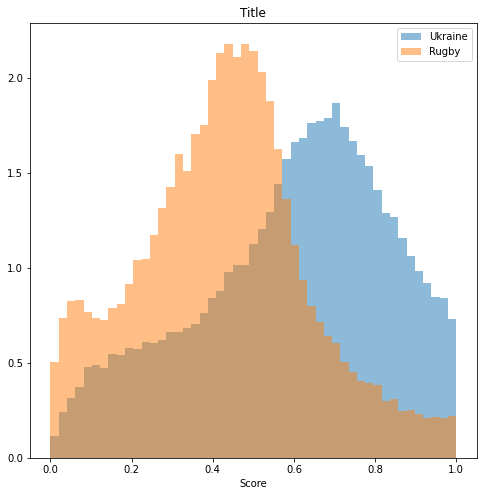

In [8]:
min_bin = 0
max_bin = 1
nbins = 50

fig, ax = plt.subplots(1,1, figsize = (8,8))
ax.hist(tweets_twibot_df['Bot scores'], bins = np.linspace(0, max_bin, nbins), label = 'Ukraine', alpha = 0.5, density = True)
ax.hist(rugby_tweets_twibot_df['Bot scores'], bins = np.linspace(0, max_bin, nbins), label = 'Rugby', alpha = 0.5, density = True)

ax.legend()
ax.set_xlabel('Score')
ax.set_title("Title")
ax.set_xlim()

(-1.1, 1.1)

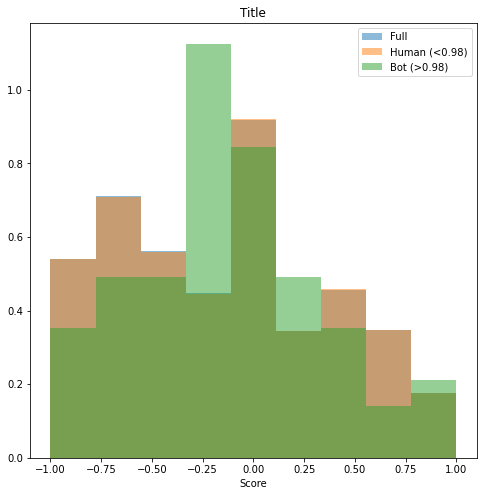

In [32]:
nbins = 10

fig, ax = plt.subplots(1,1, figsize = (8,8))
ax.hist(tweets_df['Sentiment score'], bins = np.linspace(-1, 1, nbins), label = 'Full', alpha = 0.5, density = True)
ax.hist(tweets_df['Sentiment score'].loc[np.where((tweets_twibot_full_df['Astroturf'] < 0.75) & (tweets_twibot_df['Bot scores'] < 0.98))[0]], bins = np.linspace(-1, 1, nbins), label = 'Human (<0.98)', alpha = 0.5, density = True)
ax.hist(tweets_df['Sentiment score'].loc[np.where((tweets_twibot_full_df['Astroturf'] >= 0.75)  & (tweets_twibot_df['Bot scores'] >= 0.98))[0]], bins = np.linspace(-1, 1, nbins), label = 'Bot (>0.98)', alpha = 0.5, density = True)
ax.legend()
ax.set_xlabel('Score')
ax.set_title("Title")
ax.set_xlim()

(-1.1, 1.1)

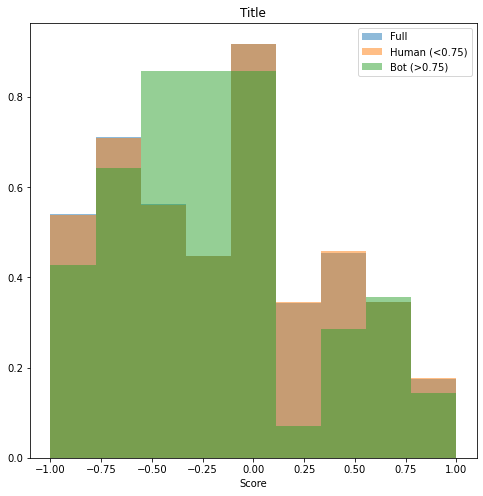

In [31]:
nbins = 10

fig, ax = plt.subplots(1,1, figsize = (8,8))
ax.hist(tweets_df['Sentiment score'], bins = np.linspace(-1, 1, nbins), label = 'Full', alpha = 0.5, density = True)
ax.hist(tweets_df['Sentiment score'].loc[np.where((tweets_twibot_full_df['Astroturf'] < 0.75) & (tweets_twibot_full_df['Bot scores'] < 0.9))[0]], bins = np.linspace(-1, 1, nbins), label = 'Human (<0.9)', alpha = 0.5, density = True)
ax.hist(tweets_df['Sentiment score'].loc[np.where((tweets_twibot_full_df['Astroturf'] >= 0.75)  & (tweets_twibot_full_df['Bot scores'] >= 0.9))[0]], bins = np.linspace(-1, 1, nbins), label = 'Bot (>0.9)', alpha = 0.5, density = True)
ax.legend()
ax.set_xlabel('Score')
ax.set_title("Title")
ax.set_xlim()

(-0.05, 1.05)

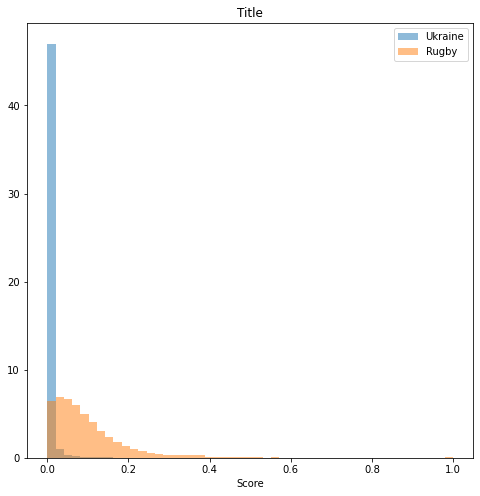

In [9]:
min_bin = 0
max_bin = 1
nbins = 50

fig, ax = plt.subplots(1,1, figsize = (8,8))
ax.hist(tweets_twibot_mixed_df['Bot scores'], bins = np.linspace(0, max_bin, nbins), label = 'Ukraine', alpha = 0.5, density = True)
ax.hist(rugby_tweets_twibot_mixed_df['Bot scores'], bins = np.linspace(0, max_bin, nbins), label = 'Rugby', alpha = 0.5, density = True)

ax.legend()
ax.set_xlabel('Score')
ax.set_title("Title")
ax.set_xlim()

In [123]:
tweets_twibot_mixed_df.loc[np.where((tweets_twibot_mixed_df['Bot scores'] > 0.5) & (tweets_twibot_mixed_df['Astroturf'] > 0.7))[0]].head(100)

,Unnamed: 0.1,Unnamed: 0,Datetime,Tweet Id,Text,Username,Like Count,Display Name,Language,User Created,Astroturf,Fake follower,Financial,Other,Overall,Self declared,Spammer,Cap,Bot scores
13959,13959,13959,2022-02-13 22:00:27+00:00,1.49298E+18,Watching RT News and noticed that it’s main advertising sponsor is a gold bullion trader … kinda makes sense if Russia invades Ukraine…🤷‍♂️😬🇷🇺🇺🇦🌟 https://t.co/gRUNHHb2vM,bankaudits1,1.0,Mike McNulty 🏴󠁧󠁢󠁳󠁣󠁴󠁿🇪🇺🇺🇦✊,en,05/01/2016,0.72,0.08,0.00,0.23,0.03,0.00,0.00,0.278726,0.599299
19801,19801,19801,2022-02-14 21:16:42+00:00,1.49333E+18,@itsJeffTiedrich Good point for the thousandths time. Trump gets away with everything. \nWHY is that? It's time for this horse shit to stop. \n\nMy guess is we'll be too distracted by Russia &amp; Ukraine.\n\nCovid ain't enough anymore to confuse &amp; upset.,NurseAndi1,1.0,Nurse_Andi_is_back,en,03/10/2021,0.78,0.41,0.00,0.36,0.78,0.11,0.09,0.807604,0.566106
51293,51293,51293,2022-02-22 22:53:59+00:00,1.49626E+18,"@politvidchannel Candace, take some time to grow up and experience life. Russia invaded Ukraine.",Tink_240,2.0,Tink_240,en,06/02/2017,0.84,0.14,0.01,0.27,0.84,0.00,0.00,0.828755,0.816000
71981,71981,71981,2022-02-27 23:26:01+00:00,1.49808E+18,"Haha... Hey, #MoscowMitch McTurtle &amp; Rand Paul. Isn't this your boy who was bribing you with some sweet aluminum cash?\n\nRT @PalmerReport\n\nRussian oligarch Oleg Deripaska is now calling for peace between Russia &amp; Ukraine. Guess he doesn’t like what’s happening to his bank account. https://t.co/3qK1YaF5Iz",tomiahonen,254.0,Tomi T Ahonen Not Afraid of Blueberries or Mangos,en,19/11/2008,0.71,0.42,0.00,0.40,0.71,0.02,0.00,0.798312,0.689937
88736,88736,88736,2022-03-04 23:56:51+00:00,1.4999E+18,"@BrianKarem @chipfranklin That’s great, and Facebook won’t cut off their link to Russia so that’ll be fun, go Ukraine!! 🇺🇦🇺🇦🇺🇦Ukraine",colleenprouty1,112.0,colleen prouty 🇺🇦🇺🇦🇺🇦Assa**anatePutin🇺🇦,en,28/01/2021,0.92,0.29,0.01,0.47,0.92,0.00,0.00,0.882963,0.556046
112240,112240,112240,2022-03-09 22:55:36+00:00,1.50169E+18,@politvidchannel If trump haven’t been a Russia asset this war in Ukraine would not be happening.,Speakrightous,1.0,Speakrighteous,en,28/12/2017,0.84,0.15,0.08,0.36,0.84,0.02,0.00,0.828755,0.802144


(-0.05, 1.05)

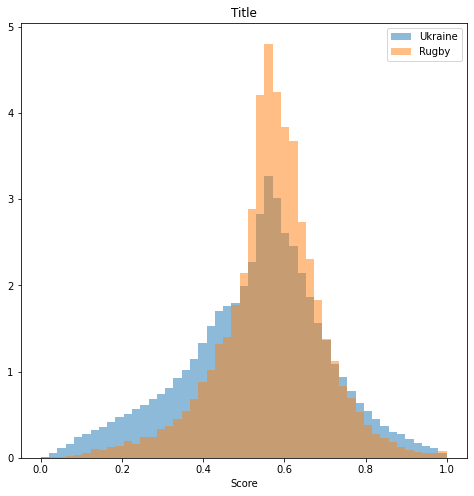

In [12]:
min_bin = 0
max_bin = 1
nbins = 50

fig, ax = plt.subplots(1,1, figsize = (8,8))
ax.hist(tweets_twibot_full_df['Bot scores'], bins = np.linspace(0, max_bin, nbins), label = 'Ukraine', alpha = 0.5, density = True)
ax.hist(rugby_tweets_twibot_full_df['Bot scores'], bins = np.linspace(0, max_bin, nbins), label = 'Rugby', alpha = 0.5, density = True)

ax.legend()
ax.set_xlabel('Score')
ax.set_title("Title")
ax.set_xlim()

(-0.05, 1.05)

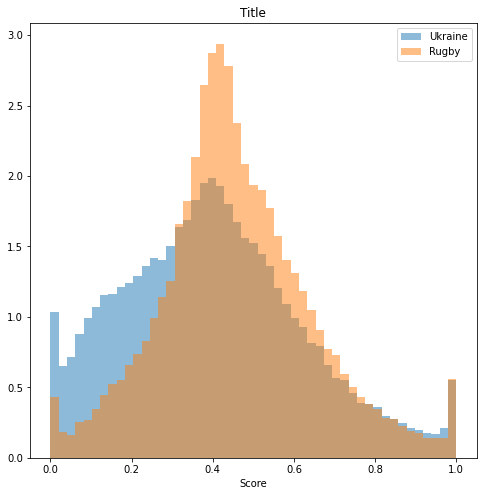

In [126]:
min_bin = 0
max_bin = 1
nbins = 50

fig, ax = plt.subplots(1,1, figsize = (8,8))
ax.hist(tweets_twibot_full_200verified2019_df['Bot scores'], bins = np.linspace(0, max_bin, nbins), label = 'Ukraine', alpha = 0.5, density = True)
ax.hist(rugby_tweets_twibot_full_200verified2019_df['Bot scores'], bins = np.linspace(0, max_bin, nbins), label = 'Rugby', alpha = 0.5, density = True)

ax.legend()
ax.set_xlabel('Score')
ax.set_title("Title")
ax.set_xlim()

In [34]:
tweets_twibot_full_df.loc[np.where((tweets_twibot_full_df['Bot scores'] > 0.97) & (tweets_twibot_full_df['Astroturf'] > 0.7))[0]].head(100)

,Unnamed: 0.1,Unnamed: 0,Datetime,Tweet Id,Text,Username,Like Count,Display Name,Language,User Created,Astroturf,Fake follower,Financial,Other,Overall,Self declared,Spammer,Cap,Bot scores
34891,34891,34891,2022-02-18 22:34:31+00:00,1.4948E+18,I worry about this guy's stability...\n\nRand Paul threatens to block Ukraine-Russia resolution https://t.co/4fO0IPeWRg via @YahooNews,BleuLimousine,5.0,Blue Limousine,en,02/02/2021,0.89,0.13,0.00,0.20,0.89,0.02,0.01,0.859506,0.979872
36505,36505,36505,2022-02-19 23:27:52+00:00,1.49518E+18,"@duty2warn @StevenHarp_ He forgot the duopoly's other cult: his very own Demonrat Fascist Party. The one that is supporting Nazis in the Ukraine while trying to start WW3 with Russia.\n\nAnd, people actually think this shiggity is just fine.",4truthnjustiz,0.0,LisaPizza,en,24/07/2016,0.81,0.10,0.00,0.23,0.17,0.00,0.00,0.641418,0.975805
40150,40150,40150,2022-02-20 23:46:21+00:00,1.49555E+18,"#WritingCommunity #ShamelessSelfPromoSunday #poem #poetry #poetrycommunity #Ukraine #Russia #UkraineRussiaCrisis #UkraineCrisis #UkraineWillResist \nUkraine, 2022 – Simily https://t.co/was3LHloNr",DanTheLyons,3.0,vortex5🌚🌝🌗🌓🌖🌔,en,23/11/2018,0.82,0.50,0.00,0.33,0.82,0.00,0.03,0.819915,0.977786
42301,42301,42301,2022-02-20 22:10:20+00:00,1.49552E+18,US bares intel on Russia in risky strategy to prevent Ukraine invasion https://t.co/1k8BZw2eeO via @YahooNews,AMiceMarina,0.0,Aida Marina🇺🇦,en,19/05/2009,0.85,0.39,0.02,0.52,0.85,0.00,0.04,0.833918,0.974472
42635,42635,42635,2022-02-20 21:56:32+00:00,1.49552E+18,"The Weekend Show: Russia/Ukraine, Trumps must testify, Virus rules &amp; the CDC - \n @MeidasTouch \n https://t.co/DnJuJpDi8T via @YouTube",voter1vote,0.0,Mrs.H. 💙 #MaskUp 😷,en,16/09/2011,0.81,0.15,0.00,0.28,0.09,0.00,0.00,0.447947,0.975150
44946,44946,44946,2022-02-21 23:45:14+00:00,1.49591E+18,Russia Withdraws From Ukraine's Border But Leaves Behind A Beautiful Wooden Horse As A Gift https://t.co/D756Yx0uGG via @TheBabylonBee,DarksideLeader,0.0,Marlon In Highland Gardens 🇺🇸🇨🇱🇺🇸,en,03/10/2011,0.71,0.46,0.02,0.44,0.71,0.01,0.03,0.798312,0.972734
47740,47740,47740,2022-02-21 23:12:41+00:00,1.4959E+18,"Trump tried to weaken NATO.\n\nMagats : Dems always ""Russia Russia Russia"" \n\nTrump sides with Putin regularly vs. Ukraine \n\nMagats : ""Russia Russia Russia"" \n\nToday Russia starts invading Ukraine. \n\nMagats : Fake news",retweetmy2cents,2.0,🤘ReTweetMy2Cents™🤘,en,12/09/2018,0.82,0.19,0.00,0.15,0.14,0.00,0.00,0.577886,0.993051
50007,50007,50007,2022-02-22 23:19:28+00:00,1.49626E+18,@williams124_t @MailOnline #TraitorTrump huh?\nCan't wait for Mexico and Indigenous people to take over land once theirs. Adam and Eve...where is your clan?\nRussia is a BIG BIG gas station..they dominate England Europe fuel needs. Ukraine Gas fields.,HewittNewton,1.0,Hewitt Newton,en,11/02/2010,0.83,0.35,0.00,0.48,0.83,0.01,0.00,0.824092,0.972901
50400,50400,50400,2022-02-22 23:11:32+00:00,1.49626E+18,"@duty2warn I remember Russia volunteering to set Ukraine and the Baltic States free. There was no war, their countries were released. I was in Estonia and remember how Russians were given the Estonians homes and were upset that they no longer controlled Estonians.",Deb41459760,27.0,Deb,en,27/07/2015,0.77,0.09,0.04,0.26,0.23,0.01,0.01,0.728711,0.977229
50715,50715,50715,2022-02-22 23:05:21+00:00,1.49626E+18,"@caslernoel @GOP Moscow should be just fine for their 4th of July party, after all, Russia is invading Ukraine and not Ukraine invading Russia.",WolverineDano,0.0,Blue Wolverine,en,12/06/2015,0.82,0.11,0.00,0.11,0.11,0.00,0.01,0.502712,0.986302


In [38]:
tweets_twibot_full_df.loc[np.where((tweets_df['Bot scores'] > 0.7) & (tweets_twibot_full_df['Bot scores'] > 0.7) & (tweets_twibot_full_df['Astroturf'] > 0.7))[0]].head(100)

,Unnamed: 0.1,Unnamed: 0,Datetime,Tweet Id,Text,Username,Like Count,Display Name,Language,User Created,Astroturf,Fake follower,Financial,Other,Overall,Self declared,Spammer,Cap,Bot scores
4715,4715,4715,2022-02-11 23:31:26+00:00,1.49228E+18,Russia reportedly makes decision to invade Ukraine Yahoo Finance.\n\nhttps://t.co/xfJnurxUFY,Joseph_Santoro,0.0,Dr. Joseph Santoro 🇺🇲🇺🇦🇺🇳🇪🇺,en,17/01/2009,0.79,0.29,0.02,0.46,0.79,0.00,0.03,0.810078,0.760586
6756,6756,6756,2022-02-11 22:28:40+00:00,1.49226E+18,#VetsResist \nRt\nWhite House: Russia now has enough forces for Ukraine invasion https://t.co/2oVEu1jlwP,askboomer1949,1.0,Jackson Medcalf-Eichholz,en,24/08/2015,0.75,0.22,0.02,0.33,0.75,0.05,0.00,0.802148,0.790829
16502,16502,16502,2022-02-14 23:42:22+00:00,1.49337E+18,"Going Underground RT (@Underground_RT\n@afshinrattansi):\n\nRussia Needs To Look in The Mirror Over Ukraine, NATO Expansion!-Advisor to President Obama.\n\nVideo ~20:28min\n\nhttps://t.co/gQgjzAB6b5",AtchaJohn,0.0,Kindly Atcha 🍀 ❌,en,13/07/2013,0.96,0.19,0.00,0.31,0.96,0.00,0.00,0.915838,0.775326
30670,30670,30670,2022-02-17 21:19:06+00:00,1.49442E+18,Fox's Bartiromo: White House playing up Russia-Ukraine crisis to distract 'from what Hillary Clinton did' | TheHill https://t.co/0zVqIWgdZj,karmin821,0.0,Trump Girl 🇺🇸👊🏼🇺🇸,en,03/10/2016,0.87,0.41,0.03,0.55,0.87,0.00,0.01,0.845754,0.707319
30842,30842,30842,2022-02-17 21:11:39+00:00,1.49442E+18,Hitler started WWll with a false flag attack.\nHistory does repeat.\nAmericas magas will stand with Russia.\nIf Ukraine explodes watch out for R/W\nfanatic attacks in this country.\nR/W= republican=maga=W/supremacist=\ntrouble here.,jbearclan,7.0,Jbearclan,en,16/06/2009,0.91,0.16,0.00,0.37,0.91,0.00,0.01,0.874858,0.779174
31248,31248,31248,2022-02-17 20:50:44+00:00,1.49441E+18,"McCain called it in 2017. Rand Paul""is now working for Vladimir Putin""\n\nRand Paul threatens to block Ukraine-Russia resolution https://t.co/WkcR9ffWWO",BergtunRune,0.0,Rune Andre Bergtun 🇳🇴 #FullyVaccinated #Boosted,en,07/04/2020,0.72,0.18,0.00,0.31,0.15,0.01,0.01,0.600488,0.800459
44042,44042,44042,2022-02-21 23:57:21+00:00,1.49591E+18,"@aravosis @chipfranklin I trump were potus, russia wouldn't be invading Ukraine, they'd be invading the USA",bean_joyanna,1.0,Joyanna Bean,en,31/01/2020,0.82,0.13,0.00,0.34,0.82,0.01,0.01,0.819915,0.923282
59795,59795,59795,2022-02-24 23:38:57+00:00,1.49699E+18,Trump wouldn't have allowed Russia to be killing people in Ukraine. People feared him. #WWIII,r_e_n_e_e_l_y_n,38.0,💅🏻Renee🏒,en,16/04/2021,0.71,0.40,0.00,0.34,0.71,0.00,0.05,0.798312,0.752375
60681,60681,60681,2022-02-25 23:56:41+00:00,1.49736E+18,"The @UN is so BLOODY worthless! Russia vetoes U.N. Security action on Ukraine, China abstains https://t.co/gJkYSzKLg8",kurtmac,0.0,Kurt,en,23/04/2008,0.80,0.41,0.02,0.52,0.80,0.04,0.10,0.812935,0.798837
61282,61282,61282,2022-02-25 23:52:19+00:00,1.49736E+18,Russia Vetoes U.N. Resolution To End Ukraine Invasion | Global News Ink https://t.co/FyrAk9fzFx,JOSEPHSAKOWSKI,0.0,JOSEPH SAKOWSKI,en,22/04/2010,0.98,0.22,0.01,0.32,0.98,0.00,0.00,0.930754,0.812266


In [127]:
tweets_twibot_full_200verified2019_df.loc[np.where((tweets_twibot_full_200verified2019_df['Bot scores'] > 0.97) & (tweets_twibot_full_200verified2019_df['Astroturf'] > 0.7))[0]].head(100)

,Unnamed: 0.1,Unnamed: 0,Datetime,Tweet Id,Text,Username,Like Count,Display Name,Language,User Created,Astroturf,Fake follower,Financial,Other,Overall,Self declared,Spammer,Cap,Bot scores
1190,1190,1190,2022-02-10 21:46:39+00:00,1.49189E+18,"Wendy Sherman: If Russia invades Ukraine, ""Vladimir Putin should understand that body bags will come back to Moscow."" https://t.co/drFpZpgjJ5",RealMacReport,10.0,Real Mac Report,en,09/02/2022,0.72,0.39,0.12,0.75,0.75,0.02,0.05,0.802148,0.999386
3498,3498,3498,2022-02-10 17:46:12+00:00,1.49183E+18,"It's been several weeks and Russia still has not invaded Ukraine\n\nAs military force may be used legitimately under UN Article 51 only in the event of ""imminent"" attack, it rather suggests what Putin is doing is extortion not self-defence\n\n#BBCpm #LBC #C4News #Newsnight #BBCqt",PhilipCJames,2.0,Philip C James 🕷️🕯️,en,26/06/2009,0.75,0.11,0.01,0.31,0.20,0.00,0.00,0.691580,0.979615
5357,5357,5357,2022-02-11 23:09:31+00:00,1.49227E+18,Paul Manafort forced the RNC in 2016 to remove anti-Russia policy on Ukraine from its platform.,greencounterktd,0.0,🌻🇺🇦greencounter kate ✍🏻,en,31/07/2010,0.93,0.18,0.00,0.34,0.93,0.00,0.01,0.891232,0.997703
5404,5404,5404,2022-02-11 23:07:47+00:00,1.49227E+18,"Why did chickens cross the road into a C-17 transport plane?\n\nCNN sources: ""Putin to delay invasion until Biden delivers chickens across the road in Ukraine for Russia to catch""",panherring,1.0,PanHerring's fish & chickens,en,29/08/2017,0.76,0.18,0.00,0.30,0.21,0.00,0.00,0.705338,0.974900
8051,8051,8051,2022-02-12 23:56:47+00:00,1.49265E+18,"Russia, Belarus begin war games amid outcry from Ukraine, West https://t.co/C8JatWkG7C via @amermilnews",MarciaSessler,1.0,Marcia Sessler,en,26/01/2013,0.81,0.43,0.01,0.41,0.81,0.00,0.06,0.816204,0.998642
8341,8341,8341,2022-02-12 23:40:53+00:00,1.49264E+18,What is the United States and the rest of Europe going to do in response if Russia attacks the Ukraine? Cut off their Mars candy bar supply if there's an invasion? Refuse to buy gas and oil from Russia? Puff up troops on the border of Ukraine while they watch?,JohnJew40051316,6.0,Captain Asparagus!,en,17/09/2018,0.86,0.23,0.00,0.30,0.86,0.01,0.00,0.839586,0.985973
9294,9294,9294,2022-02-12 22:48:50+00:00,1.49263E+18,What’s Putin’s problem?. Market Wrap: Cryptocurrencies and Stocks Drop as Russia-Ukraine Tensions Rise https://t.co/aHxtwDGI6I,ernestotree,1.0,Ernesto tree,en,25/02/2017,0.79,0.10,0.00,0.20,0.79,0.01,0.01,0.810078,0.998887
11438,11438,11438,2022-02-12 21:11:18+00:00,1.49261E+18,Did they know this was coming out? Is this why all the Russia Ukraine hysteria?? https://t.co/lYFbz00DVA,gwhill6,0.0,Southern Tennessee patriot 🇺🇸💖💙🇺🇸🇺🇸🌷,en,13/05/2018,0.74,0.21,0.03,0.23,0.12,0.02,0.02,0.528866,0.981692
13340,13340,13340,2022-02-13 22:35:36+00:00,1.49299E+18,International Leaks (@Internl_Leaks):\n\nRussia Ukraine Conflict Current Top Ten News. #RussiaUkraineConflict #Russia #Ukraine #TopTen #UK\n\nVideo 2:34min\n\nhttps://t.co/sYXWm1qF47,AtchaJohn,0.0,Kindly Atcha 🍀 ❌,en,13/07/2013,0.94,0.18,0.00,0.32,0.94,0.00,0.01,0.899551,0.982367
17000,17000,17000,2022-02-14 23:14:18+00:00,1.49336E+18,Canada is the first big test. If Trudeau gets away with this then it’s God help the rest of the West. All while the media and the WEF’s puppet govts are keeping you distracted with the Russia/Ukraine bollocks.,hartfordwolf,8.0,Brexitwolf,en,07/04/2010,0.78,0.03,0.01,0.27,0.08,0.00,0.00,0.419722,0.996503


# Correlations

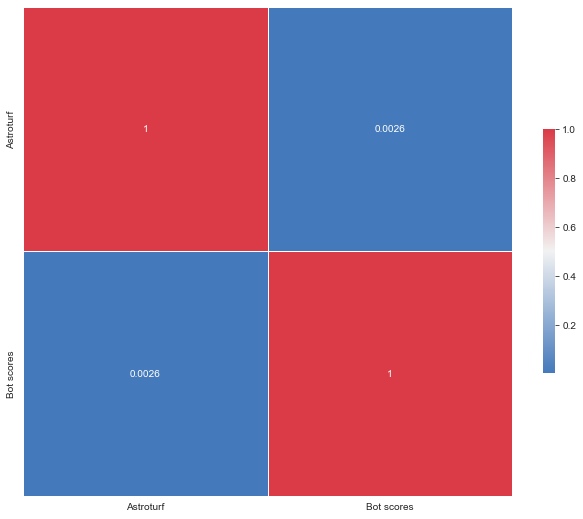

In [72]:
def CorrMtx(df, dropDuplicates = True):
    
    # Make the data a correlation matrix
    df = df.corr()
    
    # Exclude duplicate correlations by masking upper right values
    if dropDuplicates:
        mask = np.zeros_like(df, dtype = np.bool)
        mask[np.triu_indices_from(mask)] = True
    
    # Set background color/chart style
    sns.set_style(style = 'white')
    
    # Set up matplotlib figure 
    fig, ax = plt.subplots(figsize = (11,9))
    
    # Add diverging colormap from red to blue 
    cmap = sns.diverging_palette(250, 10, as_cmap = True)
    
    # Draw correlation plot with or without duplicates
    if dropDuplicates:
        sns.heatmap(df, mask = mask, cmap = cmap,
                   square = True, annot = True, 
                   linewidth = 0.5, cbar_kws = {"shrink": 0.5}, ax = ax)
    else:
        sns.heatmap(df, cmap = cmap,
           square = True, annot = True,
           linewidth = 0.5, cbar_kws = {"shrink": 0.5}, ax = ax)
        
corr_df = tweets_df.copy()
corr_df = corr_df[['Astroturf', 'Bot scores']]

#corr_df['0.75 Corr'] = np.zeros(())

CorrMtx(tweets_df[['Astroturf', 'Bot scores']], dropDuplicates = False)

In [107]:
print(len(np.where(tweets_df['Overall'] > 0.65)[0]))
print(len(np.where(tweets_df['Bot scores'] > 0.65)[0]))
print(len(np.where((tweets_df['Bot scores'] > 0.65) & (tweets_df['Astroturf'] > 0.75))[0]))
print(len(tweets_df))

20852
1133
36
112274


In [87]:
/112274

0.0002493898854587883

In [28]:
np.where((corr_df['Bot scores'] > 0.75) & (corr_df['Astroturf'] > 0.75))

(array([ 4715,  5357, 15797, 16502, 20259, 21506, 24011, 28422, 28472,
        30670, 30842, 33251, 44042, 56975, 60681, 61282, 63794, 64407,
        65527, 67832, 74771, 84149, 87256, 87976, 90096, 96911, 99186,
        99239]),)

In [29]:
corr_df['0.75 Corr'] = np.zeros((corr_df.shape[0]))

In [30]:
corr_df.head()

,Astroturf,Bot scores,0.75 Corr
0,0.10,7.980000e-06,0.0
1,0.87,3.620000e-08,0.0
2,0.09,2.290711e-02,0.0
3,0.56,3.478110e-03,0.0
4,0.52,6.381568e-02,0.0


In [31]:
corr_df['0.75 Corr'].loc[np.where((corr_df['Bot scores'] > 0.75) & (corr_df['Astroturf'] > 0.75))] = 1 

In [69]:
corr_df = pd.DataFrame()
corr_df['Aegis 0'] = np.zeros((tweets_df.shape[0]))
corr_df['Botometer 0'] = np.zeros((tweets_df.shape[0]))
corr_df['Aegis 0.2'] = np.zeros((tweets_df.shape[0]))
corr_df['Botometer 0.2'] = np.zeros((tweets_df.shape[0]))
corr_df['Aegis 0.4'] = np.zeros((tweets_df.shape[0]))
corr_df['Botometer 0.4'] = np.zeros((tweets_df.shape[0]))
corr_df['Aegis 0.6'] = np.zeros((tweets_df.shape[0]))
corr_df['Botometer 0.6'] = np.zeros((tweets_df.shape[0]))
corr_df['Aegis 0.8'] = np.zeros((tweets_df.shape[0]))
corr_df['Botometer 0.8'] = np.zeros((tweets_df.shape[0]))
corr_df['Aegis 1'] = np.zeros((tweets_df.shape[0]))
corr_df['Botometer 1'] = np.zeros((tweets_df.shape[0]))


In [70]:
corr_df['Aegis 0'].loc[np.where(tweets_df['Bot scores'] > 0)] = 1 
corr_df['Botometer 0'].loc[np.where(tweets_df['Astroturf'] > 0)] = 1 
corr_df['Aegis 0.2'].loc[np.where(tweets_df['Bot scores'] > 0.2)] = 1 
corr_df['Botometer 0.2'].loc[np.where(tweets_df['Astroturf'] > 0.2)] = 1 
corr_df['Aegis 0.4'].loc[np.where(tweets_df['Bot scores'] > 0.4)] = 1 
corr_df['Botometer 0.4'].loc[np.where(tweets_df['Astroturf'] > 0.4)] = 1 
corr_df['Aegis 0.6'].loc[np.where(tweets_df['Bot scores'] > 0.6)] = 1 
corr_df['Botometer 0.6'].loc[np.where(tweets_df['Astroturf'] > 0.6)] = 1 
corr_df['Aegis 0.8'].loc[np.where(tweets_df['Bot scores'] > 0.8)] = 1 
corr_df['Botometer 0.8'].loc[np.where(tweets_df['Astroturf'] > 0.8)] = 1 
corr_df['Aegis 1'].loc[np.where(tweets_df['Bot scores'] > 1)] = 1 
corr_df['Botometer 1'].loc[np.where(tweets_df['Astroturf'] > 1)] = 1 

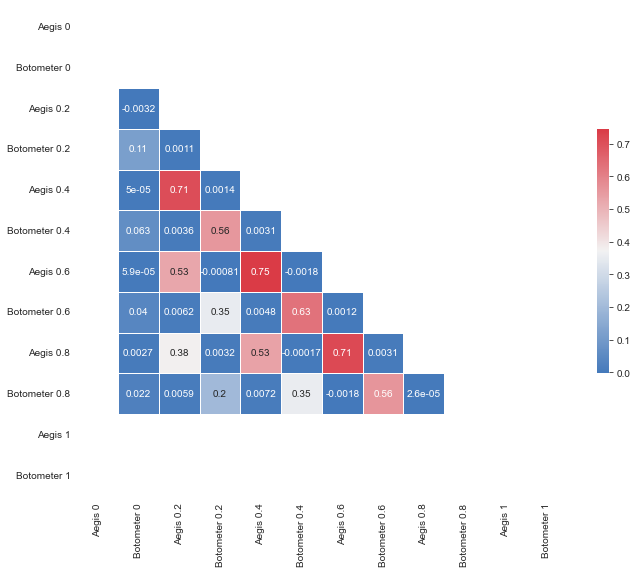

In [71]:
CorrMtx(corr_df, dropDuplicates = True)

In [51]:
corr_df.head()

,Astroturf,Bot scores
0,0.10,7.980000e-06
1,0.87,3.620000e-08
2,0.09,2.290711e-02
3,0.56,3.478110e-03
4,0.52,6.381568e-02


# Misc testing

In [2]:
import json

In [68]:
with open('../data/Twibot-20/support.json') as f:
    file_sup = json.load(f)

In [40]:
len(file)*200

43550800

In [41]:
file[1].keys()

dict_keys(['ID', 'profile', 'tweet', 'neighbor', 'domain'])

In [44]:
file[0]

{'ID': '1082775333336768517',
 'profile': {'id': '1082775333336768517 ',
  'id_str': '1082775333336768517 ',
  'name': 'Kimberly schaefer ',
  'screen_name': 'Kimberl51495037 ',
  'location': 'Baltimore, MD ',
  'profile_location': "{'id': 'c0b8e8dc81930292', 'url': 'https://api.twitter.com/1.1/geo/id/c0b8e8dc81930292.json', 'place_type': 'unknown', 'name': 'Baltimore, MD', 'full_name': 'Baltimore, MD', 'country_code': '', 'country': '', 'contained_within': [], 'bounding_box': None, 'attributes': {}} ",
  'description': ' ',
  'url': 'None ',
  'entities': "{'description': {'urls': []}} ",
  'protected': 'False ',
  'followers_count': '2 ',
  'friends_count': '386 ',
  'listed_count': '0 ',
  'created_at': 'Tue Jan 08 23:05:31 +0000 2019 ',
  'favourites_count': '203 ',
  'utc_offset': 'None ',
  'time_zone': 'None ',
  'geo_enabled': 'False ',
  'verified': 'False ',
  'statuses_count': '159 ',
  'lang': 'None ',
  'contributors_enabled': 'False ',
  'is_translator': 'False ',
  'is_t

In [127]:
tweets= file[0]["tweet"]

In [128]:
tweets

['RT @CarnivalCruise: 🎉 Are you ready to see what our newest ship’s name will be? 🎉 Thanks to all our partners for helping us unbox the name.…\n',
 'Who has time for receipts? Not me. @epson receipt scanners make it easy. No mess = no stress! Check it out at https://t.co/ofqbTdz0Qk. https://t.co/BtYwuyz9N5\n',
 'Steady wants to encourage you to invest in your financial future. Connect your bank account to @TheSteadyApp and have access to benefits like income insights, online medical visits, and cash grants of up to $1,000! Get started today by visiting https://t.co/5w3AvWd8Q0. #Sponsored https://t.co/ZHBfP5xDMg\n',
 "Good one, @rishid. But let’s see if y'all can do better than that. Come on, everybody. Show me your best #HandShaq! #ad https://t.co/xCloeLRfuM https://t.co/urVSOfTmT2\n",
 '#lsunationalchamps\n',
 'I stand with the student athletes! #WeWantToPlay\n',
 'Wish me luck, America. I’m back for #SharkWeek! It all starts TONIGHT at 8p ET on @Discovery, and catch me taking the ult

In [25]:
a.split('RT @')[1].split(':')[1]

' Three Ohio House Republicans have drafted articles of impeachment against Gov. Mike DeWine, claiming many of his admin…\n'

In [116]:
b = file[1]["tweet"][0]

TypeError: 'NoneType' object is not subscriptable

In [123]:
b = file[0]["tweet"][1]

In [125]:
b

'Who has time for receipts? Not me. @epson receipt scanners make it easy. No mess = no stress! Check it out at https://t.co/ofqbTdz0Qk. https://t.co/BtYwuyz9N5\n'

In [126]:
b.split('RT @')[1].split(':')[1]

IndexError: list index out of range

In [64]:
n_hum = 0
n_bot = 0
for idx, user in enumerate(file):
    print(user["profile"]["screen_name"], user["label"])
    if int(user["label"]) == 0:
        n_hum += 1
    elif int(user["label"]) == 1:
        n_bot +=1
        
print(n_hum, n_bot)

SHAQ  0
JenniferFishpaw  1
parscale  0
FOX13News  0
VonteThePlugNC  1
SpaceX  0
justinbieber  0
McConaughey  0
Richard37226643  1
BJP4India  0
cnaha  0
WheelsUp  0
EASPORTSFIFA  0
NileGardiner  1
SpeakerPelosi  0
LynneVCheney  0
CSI_GotGame  1
ScolariMatteo  1
jean_schumaker  1
tedcruz  0
dglubman  1
ladygaga  0
TrumpCharlotte  0
KylieJenner  0
JoeBiden  0
Jasmine82765052  1
RaoKavitha  0
ManUtd  0
US_FDA  0
BBCBreaking  0
FallGuysGame  0
JesperParnevik  0
civati  0
Twitter  0
kanyewest  0
TommyHilfiger  0
mattgaetz  0
AmitShah  0
patboydakamimi  0
GOPChairwoman  0
TuckerCarlson  0
JamillRashid  1
TeaPainUSA  1
DonJediondo  0
Cradcliff  1
ObamaFoundation  0
itzjust_tee  0
TP49873923  1
realDonaldTrFan  1
RealJamesWoods  0
StumblerTop  1
Harold54059315  1
alvxaro  0
GeraldoRivera  0
muftimenk  0
davidplouffe  0
GreggJarrett  0
USNavy  0
Forbes  0
theweeknd  0
StephenAtHome  0
RahulGandhi  0
MarinaRoseQDNA  1
NnamGotJokes  0
kreidible  1
Mike_Pence  0
IsaacBoluex  1
ysjagan  0
bbcburmese

BenTuckett1997  1
EDCtweets  1
kaustubhpujari  1
MyFedTrainer  1
MoSalah  0
fareyouthinking  1
updownside2  1
Redistrict  0
wef  0
CPMumbaiPolice  0
statehousenews  1
PFSwarts  1
lindseywriting  0
StartUpMindset  1
_NduatiKuria  1
CJR  0
RepMarkTakano  0
benmurraybruce  0
Parry18233308  0
MajorCBS  0
JerseyShore  0
nhannahjones  0
baller_royal  1
JoanneDeMic  0
SilasKi88474733  1
AshelyBenald  0
Micki_Ann  1
USTreasury  0
julie_sobinsky  0
sethmoulton  0
RepCloudTX  0
ColsonMA  1
maitlis  0
TXRandy14  0
WarEagle5905  1
faiza_mahamud  1
SenSanders  0
RepBarbaraLee  0
RepJoseSerrano  0
asheville  0
Markfrancis30o3  1
USProgressives  0
ManUnitedZone_  1
_GAKR  1
EricHolder  0
ddlovato  0
DanAshleyABC7  0
UN  0
ryangrim  0
kipmurkomen  0
tedlieu  0
JMillerBarron  1
tomfitzgerald  0
ccadelago  0
BevRisingChief  1
nyinyiang  0
ChicagoBreaking  1
latimesnational  0
pamressler  1
streetcoins  1
victoria_zoila  0
TechnologyIowa  1
maddow  0
LadyPsychCare  1
DenisDison  1
FabulousSISTERS  1
CDC_

Izzy22044236  0
BNN_Television  1
israhirsi  0
DanaPerino  0
CameronNewton  0
SamDelgadoTX  0
jodicloney  1
AlbertBreer  0
EdwardC73131880  1
SHARON_NEEDLES  0
mynamesn0tjames  1
CamSomForChange  1
stanislav_komsk  1
rjalon  0
AdamSaim1  1
BenFeibleman  0
miguelaguirref  0
newscientist  0
mitsloanexperts  1
NaturePhysics  0
BradleySmith38  0
shahidmkhaan360  1
johnquanrud  1
alvinlie21  0
mastagnilaw  1
ProfJNMoyo  0
PrincetonPGCPS  1
ProfRoots  1
shabaan_jumah  1
gosibyl  1
athomson6  0
BloombergCA  0
GwynethPaltrow  0
JohnBrennan  0
Mosetih  1
DrLaChonW4  0
mvkoficial12  0
Bourdain  0
RaheemKassam  0
bsindia  0
julieverhage  0
UKinJapan  0
Teach_data  0
amirtibon  0
MumiaMarcus  0
mikiebarb  0
kanokomatsuyama  1
KellyBr46615178  0
DavidNdii  0
TheTerminal  0
TheStalwart  1
kristibruno  0
esmedeprez  0
nickconfessore  0
HeyDrDaniel  0
tackettdc  0
Mevrick78866670  1
rcsampson  1
krustelkram  1
CSCareers  1
bmrafferty  1
EquipoDeUrresti  0
EricMarrapodi  0
AIGinsurance  0
BloombergDeal

arvindsubraman  0
JuanSheput  0
talitubbysayshi  0
Mariayigar  1
JSAndres1  0
gabricalderon  0
krugger65  0
Sylvia02564429  1
DawnRoseTurner  1
Luislopezville3  0
JuanZavalaA  0
Senators  0
Alisonbennett09  1
EdwinRoman1602  1
K_Nachbar  1
mavila_huertas  0
AoFAFinance  1
Parkton21  1
GfKPeru  1
SasquatchGirl1  1
edgarhoqui  0
impulseflyer  1
St3vi3lee  0
LuciaPinedaU  0
BiologistDan  1
salazar_atoche  0
CMetaphor  1
Andrewwood17  1
MaryAnastasiaOG  0
moxi4554  0
telmo_salinas  0
A_Traczyk  0
SwatiJaiHind  0
MorningExp  0
ustagirls  1
ArsenalWFC  0
katrinajenner9  0
brendon310  0
TheVampsTristan  0
kelly_rohrbach  0
CP24  0
AndreaHoran  1
NPOpolitiek  1
violadavis  0
ValdezKate_  0
RookieMag  0
TheKimHawthorne  0
usanoxi_ognakan  1
youtubemusic  0
16DaysEdinburgh  1
irispase  1
jloyden  0
dcomedia13  1
TheBigSisterCo1  1
petracollins  1
_AstridEdwards_  0
GuaiCarolina  1
kkelkar  0
CJJohnsonMusic  1
MrDrewScott  0
JeremyBieber  0
NateDiaz209  0
gi_rapper  0
MOInformation  0
nervousrgir

kmlewis15  1
CatValentine945  1
osbalt_  0
gregnmusic  1
samuelchoung  1
christianclancy  1
WarriorNation  1
Ryan_Cordero  1
DJFletchMD  1
mobasharahmed  1
MWaldmanDB  0
heliocastro49  0
DBJessicaRose  1
Norberta9303  1
OlympicCh_pt  0
smashingdarling  1
akilsizhatun  0
justinenriquez_  0
ChrisWiggins_  0
EY_Banking  0
hockeycardshow  0
StopLawAbuse  1
bobbo58rgw  0
AngieForburger  1
iamhordmax  0
BasketballNS  1
cbjmusic  1
sofysticated  1
SouthSideSox  1
DaringDavenport  1
omohijesha  1
NEH_ODH  1
dante_bonfim  0
oladapoyusuf  1
StephanieWeldy1  0
TheresaSKP  1
LorenaEmprende  1
RyanSmithDB  0
discoverfmla  1
TheLonerMan  1
TheRealEve  0
Guillamon  0
Beach_Carts  1
Coach_TUI  1
PRR_Fairfax  1
sean_spsully  1
MoDakhil_NBA  1
csufbusiness  1
5thwolf  1
scrivener25  1
BrianCorbett67  0
mattymatty2000  0
BreadBoi  0
CASH__BANKER  1
athanla  1
Futureproof23  1
jwooof  1
JeffMillerLAT  1
d_hudson62  0
Lillysteff01  0
STLBluesFan98  1
__Alex_  1
SomeonesAnIdiot  1
GoodmanHoops  0
TheSkimmer

portia_morgan  1
BumperGraham  0
paigewilliams03  0
boy_director  0
edersonmoraes93  0
BobStep34308097  0
5555Cal  0
willianborges88  0
DiMarzio  0
JackTWoods18  1
ollyfitz123  1
stephenthomas10  0
Rocksta38142993  1
AhmedYasineAli  1
KrushnaHiwale2  1
UEFAWomensEURO  0
godricsmith  1
Watch_LFC  1
tomwhitemedia  0
jonathanliew  0
Johnnyh17  0
RedGolfMgmtLtd  1
leifby  0
SueKell71  1
Mostafa55746069  0
n_clarke  1
_nachomonreal  0
The_tDragon  1
pauldunn81  1
garbosj  0
theawayfans  1
ConnectHerts  1
8998Philip  1
sistoney67  0
mattiassundling  1
winglewy  0
PSFLUK  1
Engage2015  1
stGuyer  1
anaginas  0
cpvoetbal  0
bryan_lusweti  1
Poatzero  1
TracyDH1  1
XabiAlonso  0
Vineekegwu  1
ellenmccarthy_  1
SkyKaveh  0
TheOfficeBBC  1
MattMorrisMedia  0
KelechiChukwu17  1
UnitedStandMUFC  1
Thiago6  0
AleBonan  0
StaffsToffee  1
EvangelistDag  0
TelegraphDucker  0
SteveTh27414417  1
JohnP_Davies  1
vonRichetti  0
NaughtyAnne2  1
campbellclaret  0
EFC_Blue1878  1
SightCareGroup  1
Paul__Barne

cb143  1
CormacJHogan  1
GalwayLifeboat  1
McConnellDaniel  1
costadelcardiff  1
Chris__Castle  1
MattQuinton  0
ElijahPlank  1
DCUFSH  1
98FM  0
VinnieDooley  1
EuCaspian  1
kaimatai  1
mutlumsn  0
politico_ie  1
BuddyBenchIre  1
HrSswhg  1
PublicHealthW  0
ONS  0
elisha05368349  1
EamonRyan  0
MailysViolaine  1
SorchaPollak  0
parkrunIE  1
aobaoill  1
RachelMMarsh  1
SteamOut  1
SealProject  1
WIDOPCHARITYOR1  1
martyandchris  1
edelcreely  1
FBIColumbia  0
dr_aissatou  1
InterActionOrg  0
DrRobertOConnor  1
vrailas  1
Space4Europe  1
tomasmcc  1
BalanceInBizIE  1
ciarageraghty  1
ITBColoursLGBTQ  1
Jfreddy21  0
INE_Chile  0
CHO2west  1
CASTeL_DCU  1
LaniganHelen  0
MDSNacion  0
R58074502  1
NicolaOBDell  1
moloneyrobert  1
thesuper8blog  1
JackTPhelan  0
CSOIreland  0
quigley_brid  1
seamuscoffey  1
BerntsonJacob  1
Beniloko1371  0
ServicioCivilCL  1
rte  0
annhogan16  1
IMSC_Sentinel  0
SRACymru  1
RTEArchives  0
DanielCunliffe  1
IrishResearch  1
IrelandLive  1
ConnectIreland  0
d

gracyolmstead  0
rcludaescher  1
scottyparker16  1
DownFrontArtist  1
d_dhannn  1
ElisaMichaels  1
Playmor2  1
SiffirgEimmot  1
David202014  1
CGravenkemper  1
SIanceEST  1
ktch31  1
ozzie_usa  1
AJDaoud  1
gcamp4  1
larrythorne6  1
UKfollowgain  1
Mensmovementcom  1
BradBec03000170  1
star_ravyn  1
nbk8a6v  1
RealSteveDorman  1
junipersage1  1
electracruise  1
CharlesRSmith10  1
TommieNash4TN27  1
Blackdogyelp  1
KBrew45  1
conservativedrc  1
Chicadog2  1
Corraandrews  1
sewbarbie52  1
Janjch23  1
John10202000  1
hilker_joe  1
IkeIsaacson2  1
DBM69  1
ZadeSmith4  1
bo_diggles  1
jessika_fisher  1
abs4763  1
HopeToBaker  1
JerryFuhrman2  1
SnagFish  1
uwstmp  1
mbartlesjackson  1
montaga  1
TipsSmall  1
shihanbrent  1
dan_stanbery  1
rvpneves  1
sanayabancii  1
americaisfree4  1
PeterFeaman  1
Valercart1  1
Sleauxgeaux  1
cyclingmama1  0
Dimitri46931489  1
krypto_slice  0
RboertJackson  1
lisadejesus1  1
davistrn2  1
ford_ronny  1
Southernxhrist  1
VaWineLVRS  1
gladiator1592  1
steele

In [69]:
with open('../data/Twibot-20/train.json') as f:
    file = json.load(f)

In [70]:
len(file)*200/0.7

2365142.8571428573

In [71]:
239/342

0.6988304093567251

In [83]:
human_idxs = []
bot_idxs = []
for idx, user in enumerate(file):
    if (user["label"]) == "0":
        human_idxs.append(idx)
    elif (user["label"]) == "1":
        bot_idxs.append(idx)
    
        

In [114]:
human_idxs = []
bot_idxs = []
human_tweets = []
bot_tweets = []
for idx, user in enumerate(file):
    print(idx)
    if (user["label"]) == "0":
        human_idxs.append(idx)
        try:
            human_tweets.extend(user["tweet"])
        except TypeError:
            pass
    elif (user["label"]) == "1":
        bot_idxs.append(idx)
        try:
            bot_tweets.extend(user["tweet"])
        except TypeError:
            pass

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064
2065
2066
2067
2068
2069
2070
2071
2072
2073
2074
2075
2076
2077
2078
2079
2080
2081
2082
2083
2084
2085
2086
2087
2088
2089
2090
2091
2092
2093
2094
2095
2096
2097
2098
2099
2100
2101
2102
2103
2104
2105
2106
2107
2108
2109
2110
2111
2112
2113
2114
2115
2116
2117
2118
2119
2120
2121
2122
2123
2124
2125
2126
2127
2128
2129
2130
2131
2132
2133
2134
2135
2136
2137
2138
2139
2140
2141
2142
2143
2144
2145
2146
2147
2148
2149
2150
2151
2152
2153
2154
2155
2156
2157
2158
2159
2160
2161
2162
2163
2164
2165
2166
2167
2168
2169
2170
2171
2172
2173
2174
2175
2176
2177
2178
2179
2180
2181
2182
2183
2184
2185
2186
2187
2188


3988
3989
3990
3991
3992
3993
3994
3995
3996
3997
3998
3999
4000
4001
4002
4003
4004
4005
4006
4007
4008
4009
4010
4011
4012
4013
4014
4015
4016
4017
4018
4019
4020
4021
4022
4023
4024
4025
4026
4027
4028
4029
4030
4031
4032
4033
4034
4035
4036
4037
4038
4039
4040
4041
4042
4043
4044
4045
4046
4047
4048
4049
4050
4051
4052
4053
4054
4055
4056
4057
4058
4059
4060
4061
4062
4063
4064
4065
4066
4067
4068
4069
4070
4071
4072
4073
4074
4075
4076
4077
4078
4079
4080
4081
4082
4083
4084
4085
4086
4087
4088
4089
4090
4091
4092
4093
4094
4095
4096
4097
4098
4099
4100
4101
4102
4103
4104
4105
4106
4107
4108
4109
4110
4111
4112
4113
4114
4115
4116
4117
4118
4119
4120
4121
4122
4123
4124
4125
4126
4127
4128
4129
4130
4131
4132
4133
4134
4135
4136
4137
4138
4139
4140
4141
4142
4143
4144
4145
4146
4147
4148
4149
4150
4151
4152
4153
4154
4155
4156
4157
4158
4159
4160
4161
4162
4163
4164
4165
4166
4167
4168
4169
4170
4171
4172
4173
4174
4175
4176
4177
4178
4179
4180
4181
4182
4183
4184
4185
4186
4187


5988
5989
5990
5991
5992
5993
5994
5995
5996
5997
5998
5999
6000
6001
6002
6003
6004
6005
6006
6007
6008
6009
6010
6011
6012
6013
6014
6015
6016
6017
6018
6019
6020
6021
6022
6023
6024
6025
6026
6027
6028
6029
6030
6031
6032
6033
6034
6035
6036
6037
6038
6039
6040
6041
6042
6043
6044
6045
6046
6047
6048
6049
6050
6051
6052
6053
6054
6055
6056
6057
6058
6059
6060
6061
6062
6063
6064
6065
6066
6067
6068
6069
6070
6071
6072
6073
6074
6075
6076
6077
6078
6079
6080
6081
6082
6083
6084
6085
6086
6087
6088
6089
6090
6091
6092
6093
6094
6095
6096
6097
6098
6099
6100
6101
6102
6103
6104
6105
6106
6107
6108
6109
6110
6111
6112
6113
6114
6115
6116
6117
6118
6119
6120
6121
6122
6123
6124
6125
6126
6127
6128
6129
6130
6131
6132
6133
6134
6135
6136
6137
6138
6139
6140
6141
6142
6143
6144
6145
6146
6147
6148
6149
6150
6151
6152
6153
6154
6155
6156
6157
6158
6159
6160
6161
6162
6163
6164
6165
6166
6167
6168
6169
6170
6171
6172
6173
6174
6175
6176
6177
6178
6179
6180
6181
6182
6183
6184
6185
6186
6187


In [113]:
len(human_tweets)

641791

In [115]:
len(bot_tweets)

756619